# Dependencies

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pingouin as pg
import seaborn as sns
from tqdm import tqdm

try:
    os.chdir('/home/users/alexno/narcolepsy-detector')
except:
    pass

from feature_descriptions import get_feature_descriptions

/home/groups/mignot/miniconda3/envs/nml/lib/python3.6/site-packages/outdated/utils.py:18: OutdatedPackageWarning: The package outdated is out of date. Your version is 0.2.0, the latest is 0.2.1.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  **kwargs


In [3]:
print(sns.__version__)

0.11.1


# Data preparation

In [20]:
data_dir = './data/narco_features'
# model_base = 'avg_kw21'
# resolutions = [1, 3, 5, 10, 15, 30]
model_base = 'avg_kw21_long'
resolutions = [1, 3, 5, 10, 15, 30, 60, 150, 300, 600, 900, 1800, 2700, 3600, 5400, 7200]
# resolutions = [15, 30]2
df_paths = [os.path.join(data_dir, '_'.join([model_base, f'r{res:02}', 'trainD_unscaled.csv'])) for res in resolutions]
print(df_paths)
df = []
for df_path, resolution in zip(df_paths, resolutions):
    _df = pd.read_csv(df_path, index_col=0)
    _df = _df.astype({'Label': int})
    _df['Resolution'] = resolution
    df.append(_df)
df = pd.concat(df).reset_index(drop=True)
display(df.head())
feat_descr = get_feature_descriptions(list(range(489)))

df_long = (pd.melt(df, id_vars=['ID', 'Cohort', 'Label', 'Resolution'], var_name='Feature', value_name='Value')
             .astype({'ID': 'string', 'Cohort': 'string', 'Label': 'uint8', 'Resolution': 'uint16', 'Feature': 'uint16'}))
df_long.to_csv('./data/narco_features/avg_kw21_long_train_unscaled.csv')

['./data/narco_features/avg_kw21_long_r01_trainD_unscaled.csv', './data/narco_features/avg_kw21_long_r03_trainD_unscaled.csv', './data/narco_features/avg_kw21_long_r05_trainD_unscaled.csv', './data/narco_features/avg_kw21_long_r10_trainD_unscaled.csv', './data/narco_features/avg_kw21_long_r15_trainD_unscaled.csv', './data/narco_features/avg_kw21_long_r30_trainD_unscaled.csv', './data/narco_features/avg_kw21_long_r60_trainD_unscaled.csv', './data/narco_features/avg_kw21_long_r150_trainD_unscaled.csv', './data/narco_features/avg_kw21_long_r300_trainD_unscaled.csv', './data/narco_features/avg_kw21_long_r600_trainD_unscaled.csv', './data/narco_features/avg_kw21_long_r900_trainD_unscaled.csv', './data/narco_features/avg_kw21_long_r1800_trainD_unscaled.csv', './data/narco_features/avg_kw21_long_r2700_trainD_unscaled.csv', './data/narco_features/avg_kw21_long_r3600_trainD_unscaled.csv', './data/narco_features/avg_kw21_long_r5400_trainD_unscaled.csv', './data/narco_features/avg_kw21_long_r7200

,ID,Cohort,Label,0,1,2,3,4,5,6,...,480,481,482,483,484,485,486,487,488,Resolution
0,01893252,KHC,0,-1.823911,23.025851,0.121177,3.936060,6.429719,7.751045,9.721126,...,0.000000,10.609062,0.000000,0.0,3.555348,2.890372,1.386294,2.995732,4.304065,1
1,03819172,KHC,0,-1.061340,23.025851,0.118269,3.906829,7.291656,7.975908,9.009447,...,0.000000,12.967249,0.000000,0.0,2.708050,2.484907,1.386294,1.945910,3.555348,1
2,04680917,KHC,0,-2.347681,23.025851,0.066563,3.898140,5.986452,6.697034,9.542087,...,10.533931,11.342289,9.553686,0.0,2.397895,1.791759,1.791759,1.945910,3.295837,1
3,05359781,KHC,0,-2.616008,23.025851,0.051544,3.887865,5.703782,6.486161,9.863707,...,12.724958,12.232794,10.767738,0.0,2.397895,2.890372,2.302585,1.945910,3.761200,1
4,05486122,KHC,0,-2.524470,23.025851,0.062151,3.935408,5.891644,6.527958,9.287672,...,0.000000,12.323811,12.634900,0.0,3.091042,3.433987,2.833213,2.397895,4.356709,1


In [5]:
# Reform dataframe
df_fac = (pd.melt(df, id_vars=['ID', 'Cohort', 'Label', 'Resolution'], var_name='Feature', value_name='Value')
            .astype({'Feature': int})
         )
groups = ['Label', 'Resolution', 'Feature']
means = df_fac.groupby(by=groups).mean().reset_index().set_index(groups)
medians = df_fac.groupby(by=['Label', 'Resolution', 'Feature']).median()
stds = df_fac.groupby(by=['Label', 'Resolution', 'Feature']).std()
display(means.query('Label == 0 and Feature == 0').Value)
display(medians.query('Label == 0 and Feature == 0').Value)

Label  Resolution  Feature
0      1           0         -1.600848
       3           0         -1.605347
       5           0         -1.610138
       10          0         -1.614601
       15          0         -1.616918
       30          0         -1.621242
       60          0         -1.636317
       150         0         -1.669215
       300         0         -1.700903
       600         0         -1.771551
       900         0         -1.803067
       1800        0         -1.896665
       2700        0         -2.030999
       3600        0         -2.164675
       5400        0         -2.357427
       7200        0         -2.501889
Name: Value, dtype: float64

Label  Resolution  Feature
0      1           0         -1.576740
       3           0         -1.572030
       5           0         -1.572399
       10          0         -1.579442
       15          0         -1.581943
       30          0         -1.585140
       60          0         -1.600774
       150         0         -1.623313
       300         0         -1.649766
       600         0         -1.700526
       900         0         -1.737505
       1800        0         -1.750517
       2700        0         -1.812924
       3600        0         -1.842187
       5400        0         -1.874031
       7200        0         -1.978533
Name: Value, dtype: float64

# Plotting

## Factor plot

In [6]:
# Reform dataframe
df_fac = (pd.melt(df, id_vars=['ID', 'Cohort', 'Label', 'Resolution'], var_name='Feature', value_name='Value')
            .astype({'Feature': int})
         )
display(df_fac.head())

,ID,Cohort,Label,Resolution,Feature,Value
0,04680917_p364,KHC,0,1,0,-2.343929
1,05359781_p258,KHC,0,1,0,-2.610823
2,05486122_p453,KHC,0,1,0,-2.514548
3,07189658_p136,KHC,0,1,0,-2.058053
4,07374561_p74,KHC,1,1,0,-2.008266


In [7]:
# Extract statistics from different groups
groups = ['Label', 'Resolution', 'Feature']
means = df_fac.groupby(by=groups).mean().reset_index().set_index(groups)
medians = df_fac.groupby(by=['Label', 'Resolution', 'Feature']).median()
stds = df_fac.groupby(by=['Label', 'Resolution', 'Feature']).std()
display(means.query('Label == 0 and Feature == 0').Value)
display(medians.query('Label == 0 and Feature == 0').Value)
# plt.plot([1, 3, 5, 10, 15, 30], means.query('Label == 0 and Feature == 0').Value)
# sns.pointplot(data=means, x='Resolution', y='Value', hue='Label')
# df_fac.groupby(by=['Label', 'Resolution', 'Feature']).median().reset_index().query('Label == 0')

Label  Resolution  Feature
0      1           0         -1.774392
       3           0         -1.789722
       5           0         -1.799170
       10          0         -1.810994
       15          0         -1.815937
       30          0         -1.825328
Name: Value, dtype: float64

Label  Resolution  Feature
0      1           0         -1.779530
       3           0         -1.781334
       5           0         -1.789716
       10          0         -1.796543
       15          0         -1.795760
       30          0         -1.810794
Name: Value, dtype: float64

In [8]:
def scale_by_group_value_in_label(df, scale_group, scale_value, div_group, groups, scale_label):
    s_0 = (df.loc[(scale_label)]  # Isolate specific label group (e.g. controls)
             .reset_index()  # we reset the index to make sure we can get specified multiindex below
             .set_index(groups, inplace=False)
             .xs(scale_value, level=scale_group)  # extract the slices (ie. feature values) at a given value (e.g. 15 s resolution)
          )
    scaled_df = []
    for label in df.index.unique(level='Label'): 
        scaled_df.append(
            (df.loc[(label)]  # isolate specific label group
               .div(s_0, level=div_group).reset_index()  # divide feature values with slices extracted from a specific label group (e.g. divide both controls and NT1s by the value at 15 s resolution)
            )
        )
        scaled_df[-1]['Label'] = label
    return pd.concat(scaled_df)

label = 0
groups = ['Resolution', 'Feature']
scale_value = 15
means_scaled = scale_by_group_value_in_label(means, groups[0], scale_value, groups[1], groups, 0)
medians_scaled = scale_by_group_value_in_label(medians, groups[0], scale_value, groups[1], groups, 0)

# Adjust label to CTRL/NT1
means_scaled['Class'] = means_scaled['Label']
means_scaled['Label'] = means_scaled['Label'].map({0: 'CTRL', 1: 'NT1'})

### Hypnodensity-derived features

In [ ]:
grid = sns.catplot(x='Resolution', y='Value', data=means_scaled.query('Feature < 465'), kind='point', order=[1, 3, 5, 10, 15, 30],
                   linestyles=['--', '-'], markers=['o', 's'], palette='colorblind', 
                   hue='Label', col='Feature', col_wrap=15, height=2.5, 
                   sharey=False, legend=False)

# Adjust the labels
for ax, (ax_idx, _, f) in zip(grid.axes.flat, feat_descr):
    if ax_idx % 15 == 0:
        ax.set_ylabel(' | '.join(f[1]))
    if ax_idx < 15:
        ax.set_title(f'Feature {ax_idx + 1}')
    else:
        ax.set_title('')
#     ax.set_ylabel('')
#     ax.set_title(feat_name, fontsize='small')
    ax.axhline(y=1.0, ls=':', c='0.5')
grid.add_legend(loc='center', bbox_to_anchor=(0.5, 1.0), ncol=2)
grid.fig.suptitle('Changes in hypnodensity-derived feature values relative to CTRL @ 15 s', y=1.01, fontsize='xx-large')
grid.fig.tight_layout()
# grid.savefig('outputs/hypnodensity_features_means_unscaled.pdf', dpi=300, bbox_inches='tight')

#### Single stage combination

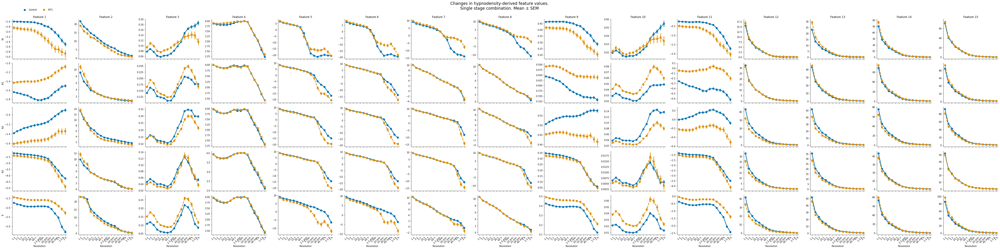

In [20]:
# make plot
grid = sns.catplot(x='Resolution', y='Value', data=df_long.query('Feature < 75').assign(Group=df_long.Label.map({0: 'Control', 1: 'NT1'})), kind='point',
                   order=sorted(df_long.Resolution.unique()),
                   linestyles=['-', '--'], markers=['o', 's'], 
                   palette='colorblind', ci=68, dodge=True,
                   hue='Group', col='Feature', col_wrap=15, height=3., aspect=1.3,
                   sharey=False, legend=False)

# Adjust the labels
for ax, (ax_idx, _, f) in zip(grid.axes.flat, feat_descr):
    if ax_idx % 15 == 0:
        ax.set_ylabel(' | '.join(f[1]))
    if ax_idx < 15:
        ax.set_title(f'Feature {ax_idx + 1}')
    else:
        ax.set_title('')
grid.set_xticklabels(rotation=45, labels=['1 s', '3 s', '5 s', '10 s', '15 s', '30 s', '60 s', '2.5 min', '5 min', '10 min', '15 min', '30 min', '45 min', '1 h', '1.5 h', '2 h'])
grid.add_legend(loc='upper left', bbox_to_anchor=(0.0225, 0.98), ncol=2)
grid.fig.suptitle('Changes in hypnodensity-derived feature values.\nSingle stage combination. Mean ± SEM', y=1.0, fontsize='xx-large')
grid.fig.tight_layout()
grid.savefig('outputs/hypnodensity_features-unscaled-single_stage_long.pdf', dpi=300, bbox_inches='tight')

In [ ]:
grid = sns.catplot(x='Resolution', y='Value', data=df_long.query('Feature < 75').assign(Group=df_long.Label.map({0: 'Control', 1: 'NT1'})), kind='point', #order=[1, 3, 5, 10, 15, 30],
                   linestyles=['-', '--'], markers=['o', 's'], 
                   palette='colorblind', ci=68, dodge=True,
                   hue='Group', col='Feature', col_wrap=15, height=2.5, 
                   sharey=False, legend=False)

# Adjust the labels
for ax, (ax_idx, _, f) in zip(grid.axes.flat, feat_descr):
    if ax_idx % 15 == 0:
        ax.set_ylabel(' | '.join(f[1]))
    if ax_idx < 15:
        ax.set_title(f'Feature {ax_idx + 1}')
    else:
        ax.set_title('')
#     ax.axhline(y=1.0, ls=':', c='0.5')
grid.add_legend(loc='upper left', bbox_to_anchor=(0.0225, 0.98), ncol=2)
grid.fig.suptitle('Changes in hypnodensity-derived feature values.\nSingle stage combination. Mean ± SEM', y=1.0, fontsize='xx-large')
grid.fig.tight_layout()
# grid.savefig('outputs/hypnodensity_features-unscaled-single_stage.pdf', dpi=300, bbox_inches='tight')

#### Two-stage combination

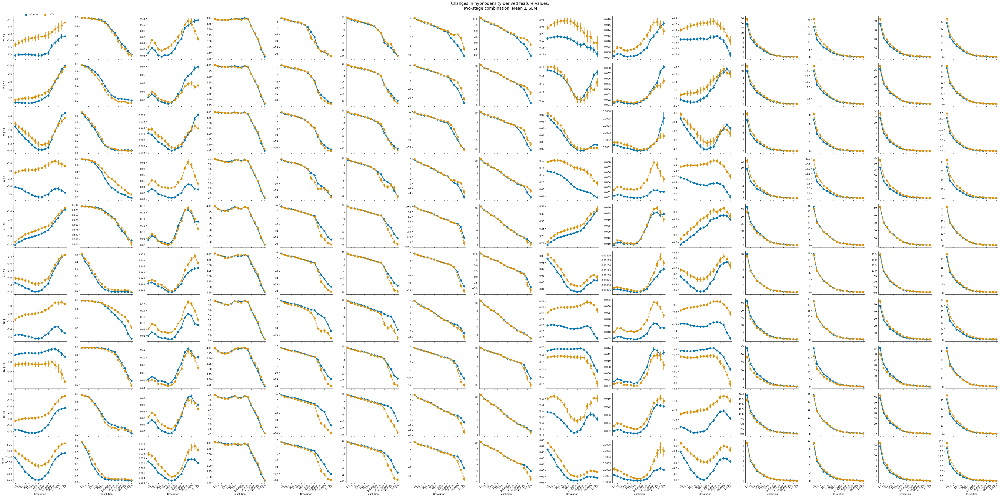

In [35]:
grid = sns.catplot(x='Resolution', y='Value', data=df_long.query('Feature >= 75 and Feature < 225').assign(Group=df_long.Label.map({0: 'Control', 1: 'NT1'})), kind='point', 
                   order=sorted(df_long.Resolution.unique()),
                   linestyles=['-', '--'], markers=['o', 's'], 
                   palette='colorblind', ci=68, dodge=True,
                   hue='Group', col='Feature', col_wrap=15, 
#                    height=2.5, 
                   height=3., aspect=1.3,
                   sharey=False, legend=False)

# Adjust the labels
for ax, (ax_idx, _, f) in zip(grid.axes.flat, feat_descr[slice(75, 225)]):
    if ax_idx % 15 == 0:
        ax.set_ylabel(' | '.join(f[1]))
    if ax_idx < 15:
        ax.set_title(f'Feature {ax_idx + 1}')
    else:
        ax.set_title('')
grid.set_xticklabels(rotation=45, labels=['1 s', '3 s', '5 s', '10 s', '15 s', '30 s', '60 s', '2.5 min', '5 min', '10 min', '15 min', '30 min', '45 min', '1 h', '1.5 h', '2 h'])
grid.add_legend(loc='upper left', bbox_to_anchor=(0.0225, 0.98), ncol=2)
grid.fig.suptitle('Changes in hypnodensity-derived feature values.\nTwo-stage combination. Mean ± SEM', y=1.0, fontsize='xx-large')
grid.fig.tight_layout()
grid.savefig('outputs/hypnodensity_features-unscaled-two_stages_long.pdf', dpi=300, bbox_inches='tight')

#### Three-stage combination

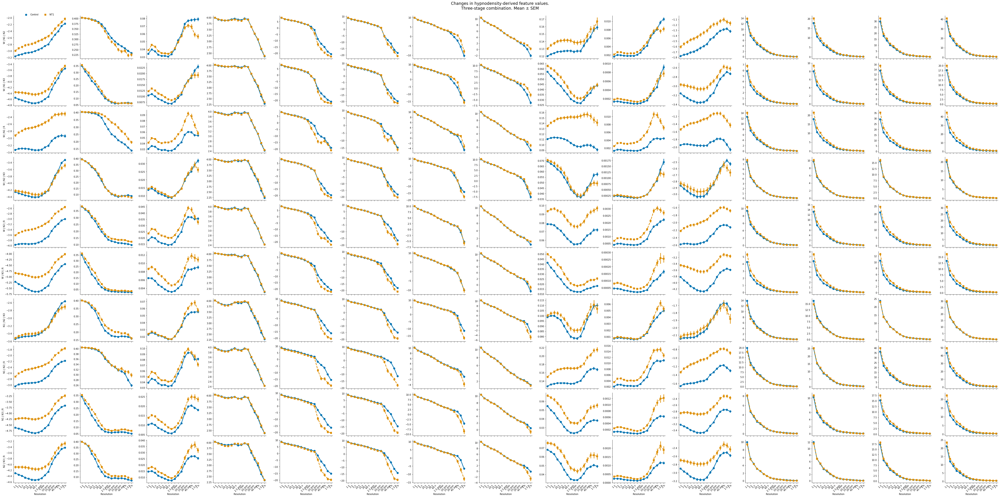

In [36]:
grid = sns.catplot(x='Resolution', y='Value', data=df_long.query('Feature >= 225 and Feature < 375').assign(Group=df_long.Label.map({0: 'Control', 1: 'NT1'})), kind='point', 
#                    order=[1, 3, 5, 10, 15, 30],
                   order=sorted(df_long.Resolution.unique()),
                   linestyles=['-', '--'], markers=['o', 's'], 
                   palette='colorblind', ci=68, dodge=True,
                   hue='Group', col='Feature', col_wrap=15, 
#                    height=2.5, 
                   height=3., aspect=1.3,
                   sharey=False, legend=False)

# Adjust the labels
for ax, (ax_idx, _, f) in zip(grid.axes.flat, feat_descr[slice(225, 375)]):
    if ax_idx % 15 == 0:
        ax.set_ylabel(' | '.join(f[1]))
    if ax_idx < 15:
        ax.set_title(f'Feature {ax_idx + 1}')
    else:
        ax.set_title('')
grid.set_xticklabels(rotation=45, labels=['1 s', '3 s', '5 s', '10 s', '15 s', '30 s', '60 s', '2.5 min', '5 min', '10 min', '15 min', '30 min', '45 min', '1 h', '1.5 h', '2 h'])
grid.add_legend(loc='upper left', bbox_to_anchor=(0.0225, 0.98), ncol=2)
grid.fig.suptitle('Changes in hypnodensity-derived feature values.\nThree-stage combination. Mean ± SEM', y=1.0, fontsize='xx-large')
grid.fig.tight_layout()
grid.savefig('outputs/hypnodensity_features-unscaled-three_stages_long.pdf', dpi=300, bbox_inches='tight')

#### Four-five-stage combination

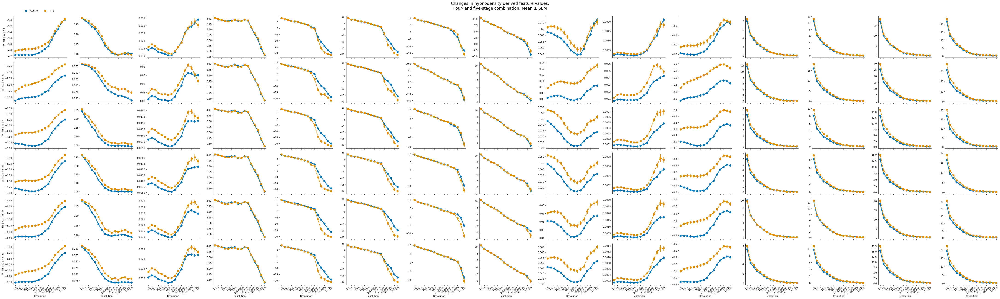

In [37]:
grid = sns.catplot(x='Resolution', y='Value', data=df_long.query('Feature >= 375 and Feature < 465').assign(Group=df_long.Label.map({0: 'Control', 1: 'NT1'})), kind='point', 
                   order=sorted(df_long.Resolution.unique()),
                   linestyles=['-', '--'], markers=['o', 's'], 
                   palette='colorblind', ci=68, dodge=True,
                   hue='Group', col='Feature', col_wrap=15, 
#                    height=2.5, aspect=3, 
                   height=3., aspect=1.3,
                   sharey=False, legend=False)

# Adjust the labels
for ax, (ax_idx, _, f) in zip(grid.axes.flat, feat_descr[slice(375, 465)]):
    if ax_idx % 15 == 0:
        ax.set_ylabel(' | '.join(f[1]))
    if ax_idx < 15:
        ax.set_title(f'Feature {ax_idx + 1}')
    else:
        ax.set_title('')
#     ax.axhline(y=1.0, ls=':', c='0.5')
grid.add_legend(loc='upper left', bbox_to_anchor=(0.0225, 0.98), ncol=2)
grid.set_xticklabels(rotation=45, labels=['1 s', '3 s', '5 s', '10 s', '15 s', '30 s', '60 s', '2.5 min', '5 min', '10 min', '15 min', '30 min', '45 min', '1 h', '1.5 h', '2 h'])
grid.fig.suptitle('Changes in hypnodensity-derived feature values.\nFour- and five-stage combination. Mean ± SEM', y=1.0, fontsize='xx-large')
grid.fig.tight_layout()
grid.savefig('outputs/hypnodensity_features-unscaled-four_five_stages_long.pdf', dpi=300, bbox_inches='tight')

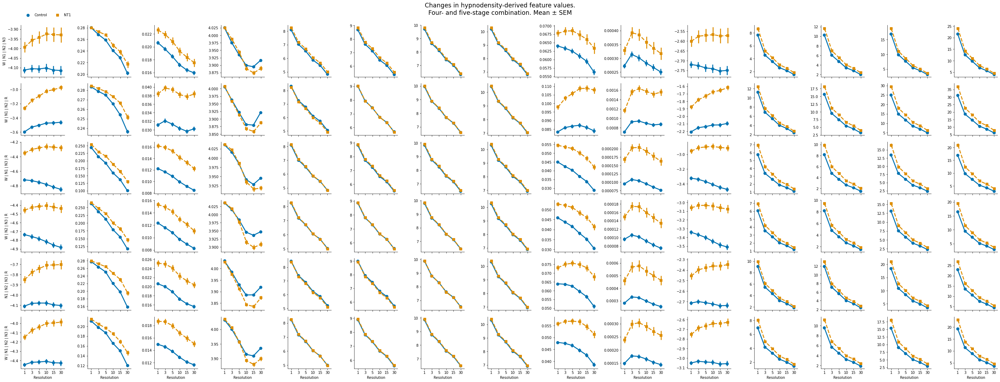

In [139]:
grid = sns.catplot(x='Resolution', y='Value', data=df_long.query('Feature >= 375 and Feature < 465').assign(Group=df_long.Label.map({0: 'Control', 1: 'NT1'})), kind='point', order=[1, 3, 5, 10, 15, 30],
                   linestyles=['-', '--'], markers=['o', 's'], 
                   palette='colorblind', ci=68, dodge=True,
                   hue='Group', col='Feature', col_wrap=15, height=2.5, 
                   sharey=False, legend=False)

# Adjust the labels
for ax, (ax_idx, _, f) in zip(grid.axes.flat, feat_descr[slice(375, 465)]):
    if ax_idx % 15 == 0:
        ax.set_ylabel(' | '.join(f[1]))
    if ax_idx < 15:
        ax.set_title(f'Feature {ax_idx + 1}')
    else:
        ax.set_title('')
#     ax.axhline(y=1.0, ls=':', c='0.5')
grid.add_legend(loc='upper left', bbox_to_anchor=(0.0225, 0.98), ncol=2)
grid.fig.suptitle('Changes in hypnodensity-derived feature values.\nFour- and five-stage combination. Mean ± SEM', y=1.0, fontsize='xx-large')
grid.fig.tight_layout()
# grid.savefig('outputs/hypnodensity_features-unscaled-four_five_stages.pdf', dpi=300, bbox_inches='tight')

### Hypnogram-derived features

In [17]:
df_long.Resolution.unique()

array([   1,    3,    5,   10,   15,   30,   60,  150,  300,  600,  900,
       1800, 2700, 3600, 5400, 7200], dtype=uint16)

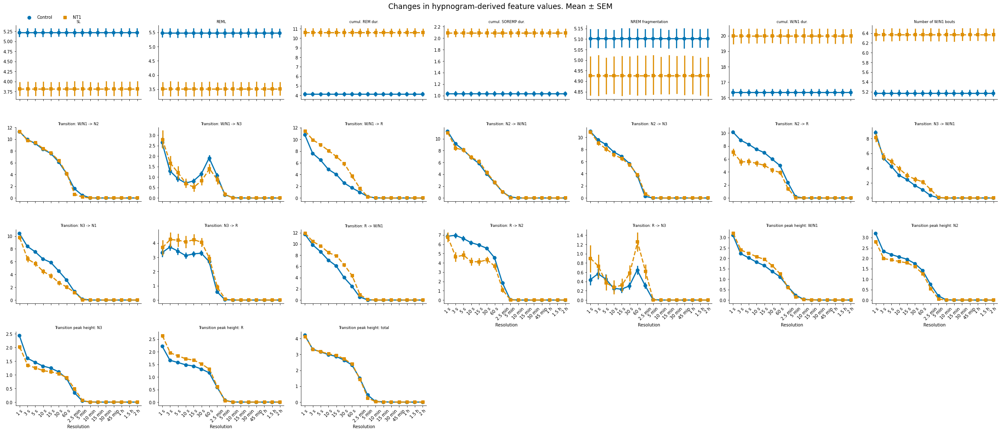

In [12]:
grid = sns.catplot(x='Resolution', y='Value', data=df_long.query('Feature >= 465').assign(Group=df_long.Label.map({0: 'Control', 1: 'NT1'})), kind='point', 
#                    order=[1, 3, 5, 10, 15, 30],
                   order=sorted(df_long.Resolution.unique()),
                   linestyles=['-', '--'], markers=['o', 's'], 
                   palette='colorblind', ci=68, dodge=True,
                   hue='Group', col='Feature', col_wrap=7, height=3.5, aspect=1.25,
                   sharey=False, legend=False)

# Adjust the labels
for ax, (ax_idx, feat_idx) in zip(grid.axes.flat, enumerate(range(465, 489))):
    if ax_idx < 2:
        feat_name = feat_descr[feat_idx][2][0]
    else:
        feat_name = feat_descr[feat_idx][2]
    if ax_idx == 2:
        feat_name = 'cumul. REM dur.'
    elif ax_idx == 3:
        feat_name = 'cumul. SOREMP dur.'
    elif ax_idx == 5:
        feat_name = 'cumul. W/N1 dur.'
    ax.set_ylabel('')
    ax.set_title(feat_name, fontsize='small')
#     ax.axhline(y=1.0, ls=':', c='0.5')
grid.set_xticklabels(rotation=45, labels=['1 s', '3 s', '5 s', '10 s', '15 s', '30 s', '60 s', '2.5 min', '5 min', '10 min', '15 min', '30 min', '45 min', '1 h', '1.5 h', '2 h'])
grid.add_legend(loc='upper left', bbox_to_anchor=(0.0225, 0.98), ncol=2)
# grid.add_legend(loc='upper center', bbox_to_anchor=(0.5, 0.98), ncol=2)
# grid.fig.suptitle('Changes in hypnogram-derived feature values relative to CTRL @ 15 s', y=1.0, fontsize='xx-large')
# grid.fig.tight_layout()
# grid.savefig('outputs/hypnogram_features_means_unscaled.pdf', dpi=300, bbox_inches='tight')
grid.fig.suptitle('Changes in hypnogram-derived feature values. Mean ± SEM', y=1.0, fontsize='xx-large')
grid.fig.tight_layout()
grid.savefig('outputs/hypnogram_features-unscaled_long.pdf', dpi=300, bbox_inches='tight')

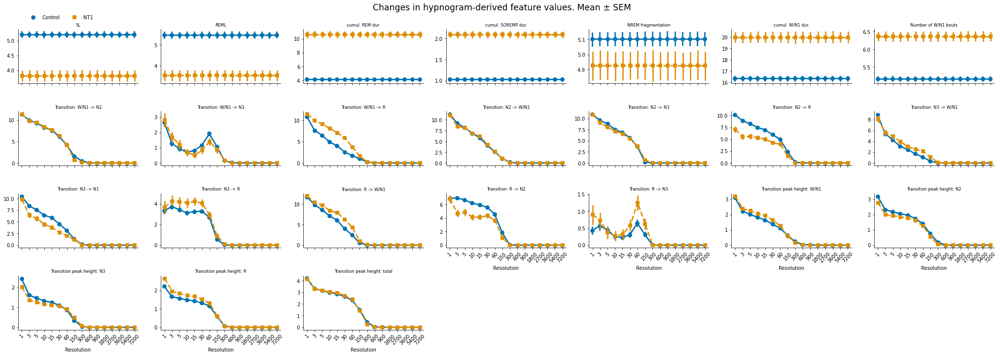

In [25]:
grid = sns.catplot(x='Resolution', y='Value', data=df_long.query('Feature >= 465').assign(Group=df_long.Label.map({0: 'Control', 1: 'NT1'})), kind='point', 
#                    order=[1, 3, 5, 10, 15, 30],
                   order=sorted(df_long.Resolution.unique()),
                   linestyles=['-', '--'], markers=['o', 's'], 
                   palette='colorblind', ci=68, dodge=True,
                   hue='Group', col='Feature', col_wrap=7, height=2.5, aspect=1.25,
                   sharey=False, legend=False)

# Adjust the labels
for ax, (ax_idx, feat_idx) in zip(grid.axes.flat, enumerate(range(465, 489))):
    if ax_idx < 2:
        feat_name = feat_descr[feat_idx][2][0]
    else:
        feat_name = feat_descr[feat_idx][2]
    if ax_idx == 2:
        feat_name = 'cumul. REM dur.'
    elif ax_idx == 3:
        feat_name = 'cumul. SOREMP dur.'
    elif ax_idx == 5:
        feat_name = 'cumul. W/N1 dur.'
    ax.set_ylabel('')
    ax.set_title(feat_name, fontsize='small')
#     ax.axhline(y=1.0, ls=':', c='0.5')
grid.set_xticklabels(rotation=45)
grid.add_legend(loc='upper left', bbox_to_anchor=(0.0225, 0.98), ncol=2)
# grid.add_legend(loc='upper center', bbox_to_anchor=(0.5, 0.98), ncol=2)
# grid.fig.suptitle('Changes in hypnogram-derived feature values relative to CTRL @ 15 s', y=1.0, fontsize='xx-large')
# grid.fig.tight_layout()
# grid.savefig('outputs/hypnogram_features_means_unscaled.pdf', dpi=300, bbox_inches='tight')
grid.fig.suptitle('Changes in hypnogram-derived feature values. Mean ± SEM', y=1.0, fontsize='xx-large')
grid.fig.tight_layout()
# grid.savefig('outputs/hypnogram_features-unscaled.pdf', dpi=300, bbox_inches='tight')

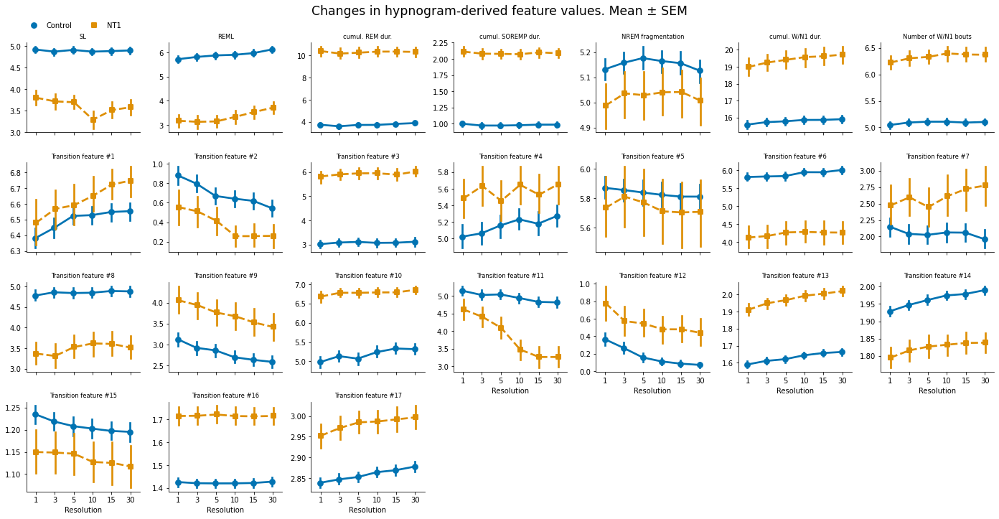

In [141]:
grid = sns.catplot(x='Resolution', y='Value', data=df_long.query('Feature >= 465').assign(Group=df_long.Label.map({0: 'Control', 1: 'NT1'})), kind='point', order=[1, 3, 5, 10, 15, 30],
                   linestyles=['-', '--'], markers=['o', 's'], 
                   palette='colorblind', ci=68, dodge=True,
                   hue='Group', col='Feature', col_wrap=7, height=2.5, 
                   sharey=False, legend=False)

# Adjust the labels
for ax, (ax_idx, feat_idx) in zip(grid.axes.flat, enumerate(range(465, 489))):
    if ax_idx < 2:
        feat_name = feat_descr[feat_idx][2][0]
    else:
        feat_name = feat_descr[feat_idx][2]
    if ax_idx == 2:
        feat_name = 'cumul. REM dur.'
    elif ax_idx == 3:
        feat_name = 'cumul. SOREMP dur.'
    elif ax_idx == 5:
        feat_name = 'cumul. W/N1 dur.'
    ax.set_ylabel('')
    ax.set_title(feat_name, fontsize='small')
#     ax.axhline(y=1.0, ls=':', c='0.5')
grid.add_legend(loc='upper left', bbox_to_anchor=(0.0225, 0.98), ncol=2)
# grid.add_legend(loc='upper center', bbox_to_anchor=(0.5, 0.98), ncol=2)
# grid.fig.suptitle('Changes in hypnogram-derived feature values relative to CTRL @ 15 s', y=1.0, fontsize='xx-large')
# grid.fig.tight_layout()
# grid.savefig('outputs/hypnogram_features_means_unscaled.pdf', dpi=300, bbox_inches='tight')
grid.fig.suptitle('Changes in hypnogram-derived feature values. Mean ± SEM', y=1.0, fontsize='xx-large')
grid.fig.tight_layout()
grid.savefig('outputs/hypnogram_features-unscaled.pdf', dpi=300, bbox_inches='tight')

In [41]:
means.reset_index()

,Label,Resolution,Feature,Value
0,0,1,0,-1.774392
1,0,1,1,21.089246
2,0,1,2,0.124913
3,0,1,3,3.882091
4,0,1,4,6.607107
...,...,...,...,...
5863,1,30,484,2.020437
5864,1,30,485,1.838023
5865,1,30,486,1.117165
5866,1,30,487,1.715726


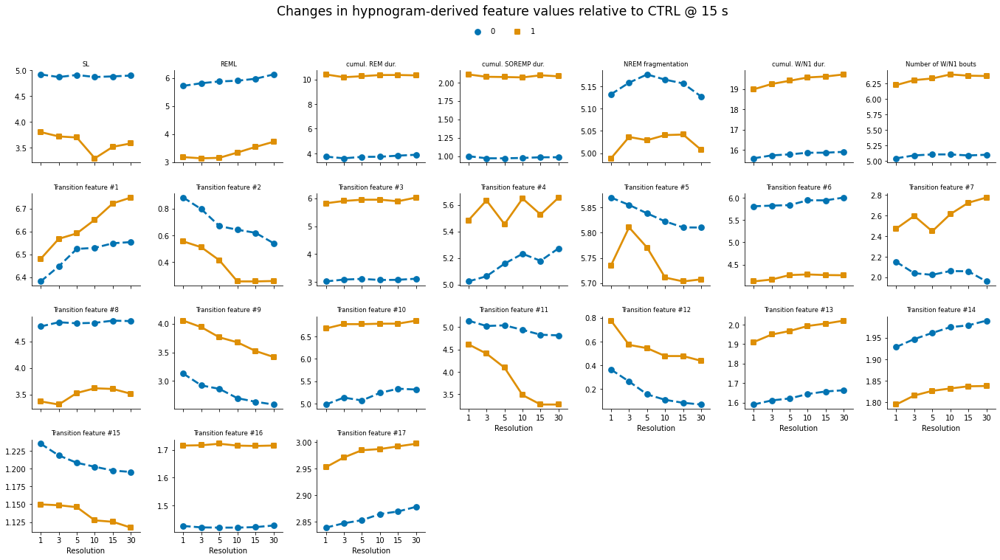

In [43]:
grid = sns.catplot(x='Resolution', y='Value', data=means.reset_index().query('Feature >= 465'), kind='point', order=[1, 3, 5, 10, 15, 30],
                   linestyles=['--', '-'], markers=['o', 's'], palette='colorblind', 
                   hue='Label', col='Feature', col_wrap=7, height=2.5, 
                   sharey=False, legend=False)

# Adjust the labels
for ax, (ax_idx, feat_idx) in zip(grid.axes.flat, enumerate(range(465, 489))):
    if ax_idx < 2:
        feat_name = feat_descr[feat_idx][2][0]
    else:
        feat_name = feat_descr[feat_idx][2]
    if ax_idx == 2:
        feat_name = 'cumul. REM dur.'
    elif ax_idx == 3:
        feat_name = 'cumul. SOREMP dur.'
    elif ax_idx == 5:
        feat_name = 'cumul. W/N1 dur.'
    ax.set_ylabel('')
    ax.set_title(feat_name, fontsize='small')
#     ax.axhline(y=1.0, ls=':', c='0.5')
grid.add_legend(loc='center', bbox_to_anchor=(0.5, 1.0), ncol=2)
grid.fig.suptitle('Changes in hypnogram-derived feature values relative to CTRL @ 15 s', y=1.05, fontsize='xx-large')
grid.fig.tight_layout()
# grid.savefig('outputs/hypnogram_features_means_unscaled.pdf', dpi=300, bbox_inches='tight')

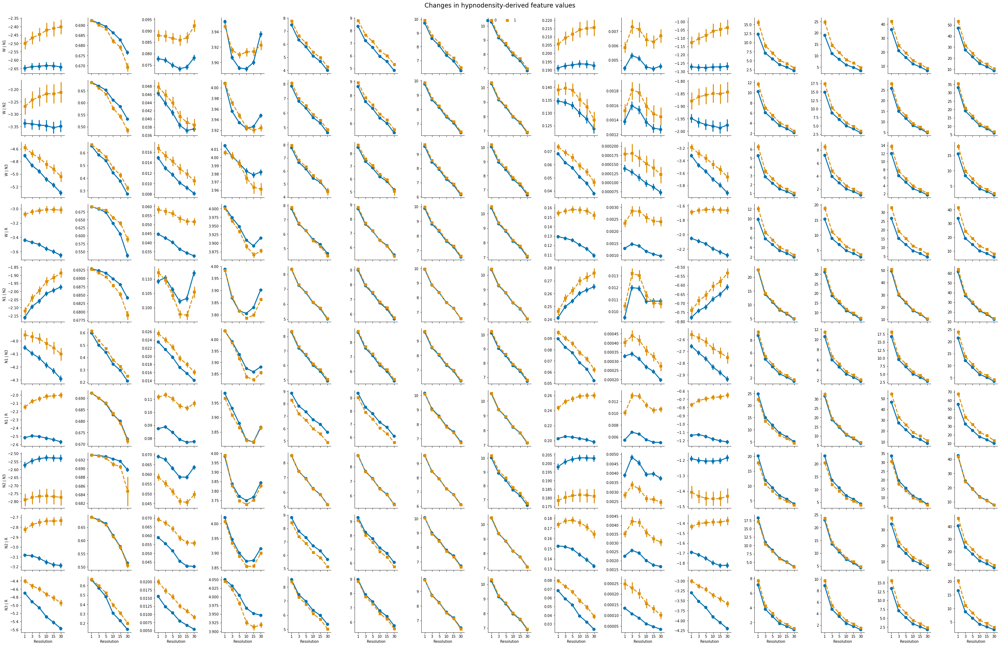

In [88]:
grid = sns.catplot(x='Resolution', y='Value', data=df_long.query('Feature >= 75 and Feature < 225'), kind='point', order=[1, 3, 5, 10, 15, 30],
                   linestyles=['-', '--'], markers=['o', 's'], 
                   palette='colorblind', ci=68, dodge=True,
                   hue='Label', col='Feature', col_wrap=15, height=2.5, 
                   sharey=False, legend=False)

# Adjust the labels
for ax, (ax_idx, _, f) in zip(grid.axes.flat, feat_descr[slice(75, 225)]):
    if ax_idx % 15 == 0:
        ax.set_ylabel(' | '.join(f[1]))
    if ax_idx < 15:
        ax.set_title(f'Feature {ax_idx + 1}')
    else:
        ax.set_title('')
#     ax.axhline(y=1.0, ls=':', c='0.5')
grid.add_legend(loc='upper center', bbox_to_anchor=(0.5, 0.98), ncol=2)
grid.fig.suptitle('Changes in hypnodensity-derived feature values', y=1.0, fontsize='xx-large')
grid.fig.tight_layout()
# grid.savefig('outputs/hypnogram_features_means_unscaled.pdf', dpi=300, bbox_inches='tight')

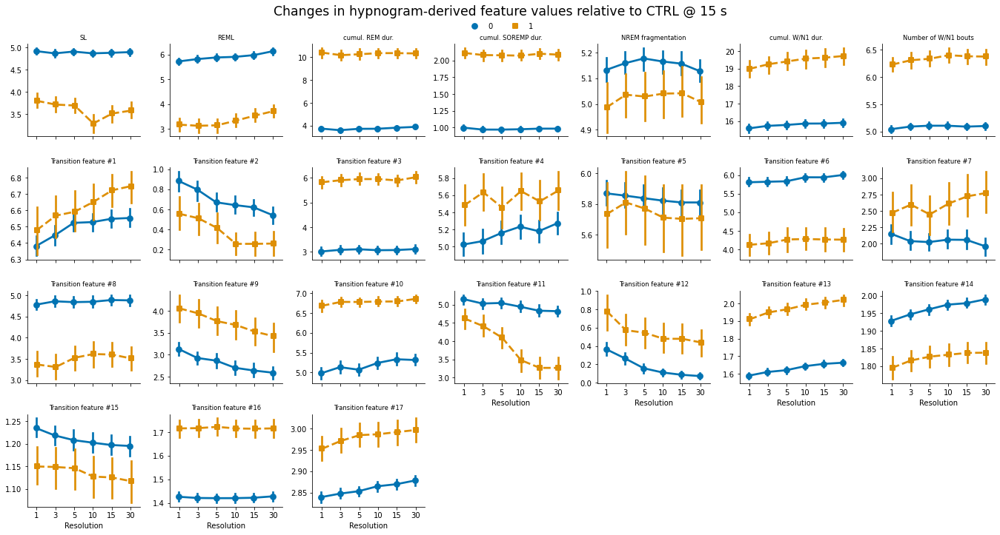

In [69]:
grid = sns.catplot(x='Resolution', y='Value', data=df_long.query('Feature >= 465'), kind='point', order=[1, 3, 5, 10, 15, 30],
                   linestyles=['-', '--'], markers=['o', 's'], 
                   palette='colorblind', ci=68, dodge=True,
                   hue='Label', col='Feature', col_wrap=7, height=2.5, 
                   sharey=False, legend=False)

# Adjust the labels
for ax, (ax_idx, feat_idx) in zip(grid.axes.flat, enumerate(range(465, 489))):
    if ax_idx < 2:
        feat_name = feat_descr[feat_idx][2][0]
    else:
        feat_name = feat_descr[feat_idx][2]
    if ax_idx == 2:
        feat_name = 'cumul. REM dur.'
    elif ax_idx == 3:
        feat_name = 'cumul. SOREMP dur.'
    elif ax_idx == 5:
        feat_name = 'cumul. W/N1 dur.'
    ax.set_ylabel('')
    ax.set_title(feat_name, fontsize='small')
#     ax.axhline(y=1.0, ls=':', c='0.5')
grid.add_legend(loc='upper center', bbox_to_anchor=(0.5, 0.98), ncol=2)
grid.fig.suptitle('Changes in hypnogram-derived feature values relative to CTRL @ 15 s', y=1.0, fontsize='xx-large')
grid.fig.tight_layout()
# grid.savefig('outputs/hypnogram_features_means_unscaled.pdf', dpi=300, bbox_inches='tight')

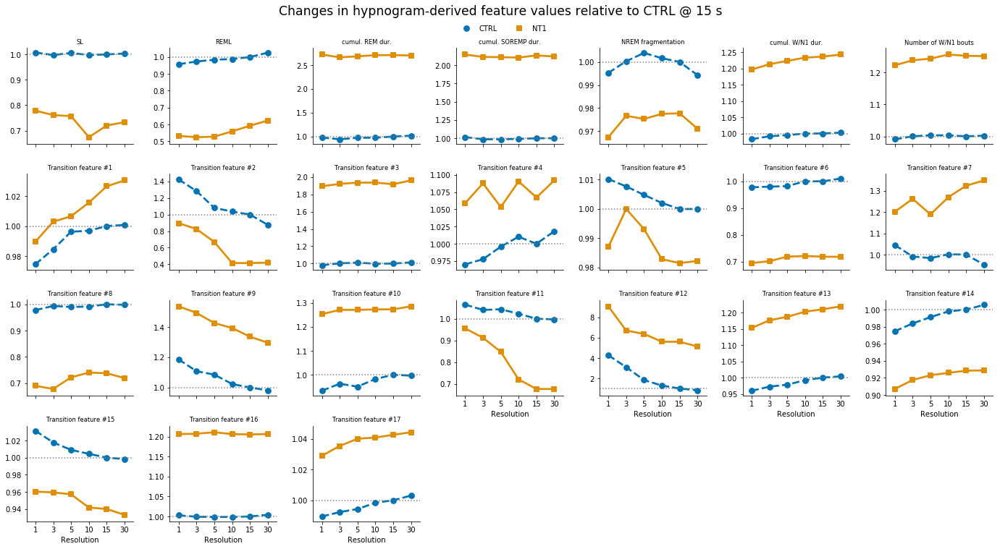

In [51]:
grid = sns.catplot(x='Resolution', y='Value', data=means_scaled.query('Feature >= 465'), kind='point', order=[1, 3, 5, 10, 15, 30],
                   linestyles=['--', '-'], markers=['o', 's'], palette='colorblind', 
                   hue='Label', col='Feature', col_wrap=7, height=2.5, 
                   sharey=False, legend=False)

# Adjust the labels
for ax, (ax_idx, feat_idx) in zip(grid.axes.flat, enumerate(range(465, 489))):
    if ax_idx < 2:
        feat_name = feat_descr[feat_idx][2][0]
    else:
        feat_name = feat_descr[feat_idx][2]
    if ax_idx == 2:
        feat_name = 'cumul. REM dur.'
    elif ax_idx == 3:
        feat_name = 'cumul. SOREMP dur.'
    elif ax_idx == 5:
        feat_name = 'cumul. W/N1 dur.'
    ax.set_ylabel('')
    ax.set_title(feat_name, fontsize='small')
    ax.axhline(y=1.0, ls=':', c='0.5')
grid.add_legend(loc='center', bbox_to_anchor=(0.5, 1.0), ncol=2)
grid.fig.suptitle('Changes in hypnogram-derived feature values relative to CTRL @ 15 s', y=1.05, fontsize='xx-large')
grid.fig.tight_layout()
# grid.savefig('outputs/hypnogram_features_means_unscaled.pdf', dpi=300, bbox_inches='tight')

## Heatmap of relative changes

In [7]:
# Reform dataframe
df_fac = (pd.melt(df, id_vars=['ID', 'Cohort', 'Label', 'Resolution'], var_name='Feature', value_name='Value')
            .astype({'Feature': int})
         )
display(df_fac.head())

# Extract statistics from different groups
groups = ['Label', 'Resolution', 'Feature']
means = df_fac.groupby(by=groups).mean().reset_index().set_index(groups)
medians = df_fac.groupby(by=['Label', 'Resolution', 'Feature']).median()
stds = df_fac.groupby(by=['Label', 'Resolution', 'Feature']).std()
display(means.query('Label == 0 and Feature == 0'))
display(medians.query('Label == 0 and Feature == 0'))
# plt.plot([1, 3, 5, 10, 15, 30], means.query('Label == 0 and Feature == 0').Value)
# sns.pointplot(data=means, x='Resolution', y='Value', hue='Label')
# df_fac.groupby(by=['Label', 'Resolution', 'Feature']).median().reset_index().query('Label == 0')

,ID,Cohort,Label,Resolution,Feature,Value
0,04680917_p364,KHC,0,1,0,-2.343929
1,05359781_p258,KHC,0,1,0,-2.610823
2,05486122_p453,KHC,0,1,0,-2.514548
3,07189658_p136,KHC,0,1,0,-2.058053
4,07374561_p74,KHC,1,1,0,-2.008266


Value
Label Resolution Feature          
0     1          0       -1.774392
      3          0       -1.789722
      5          0       -1.799170
      10         0       -1.810994
      15         0       -1.815937
      30         0       -1.825328

Value
Label Resolution Feature          
0     1          0       -1.779530
      3          0       -1.781334
      5          0       -1.789716
      10         0       -1.796543
      15         0       -1.795760
      30         0       -1.810794

In [8]:
def get_relative_change_from_ctrls(df, scale_group, scale_value, div_group, groups, scale_label):
    s_0 = (df.loc[(scale_label)]  # Isolate specific label group (e.g. controls)
             .reset_index()  # we reset the index to make sure we can get specified multiindex below
             .set_index(groups, inplace=False)
             .xs(scale_value, level=scale_group)  # extract the slices (ie. feature values) at a given value (e.g. 15 s resolution)
          )
    scaled_df = []
    for label in df.index.unique(level='Label'): 
        scaled_df.append(
            (df.loc[(label)]  # isolate specific label group
               .div(s_0, level=div_group).reset_index()  # divide feature values with slices extracted from a specific label group (e.g. divide both controls and NT1s by the value at 15 s resolution)
            )
        )
        scaled_df[-1]['Label'] = label
    return pd.concat(scaled_df)

label = 0
groups = ['Resolution', 'Feature']
scale_value = 15
means_scaled = scale_by_group_value_in_label(means, groups[0], scale_value, groups[1], groups, 0)
medians_scaled = scale_by_group_value_in_label(medians, groups[0], scale_value, groups[1], groups, 0)

# Adjust label to CTRL/NT1
means_scaled['Class'] = means_scaled['Label']
means_scaled['Label'] = means_scaled['Label'].map({0: 'CTRL', 1: 'NT1'})

In [94]:
__df

Value
Resolution Feature          
1          465     -0.227549
           466     -0.445060
           467      1.776773
           468      1.114707
           469     -0.028029
           470      0.218075
           471      0.234120
           472      0.015460
           473     -0.370715
           474      0.929805
           475      0.091399
           476     -0.022986
           477     -0.289916
           478      0.149845
           479     -0.294996
           480      0.294923
           481      0.341311
           482     -0.103150
           483      1.125801
           484      0.201412
           485     -0.069310
           486     -0.068949
           487      0.203035
           488      0.039966
3          465     -0.236866
           466     -0.461578
           467      1.820905
           468      1.143306
           469     -0.023658
           470      0.223736
...                      ...
15         483      4.596304
           484      0.210362
           485     -0.071550
           486     -0.060107
           487      0.205534
           488      0.042638
30         465     -0.268965
           466     -0.393012
           467      1.651642
           468      1.119631
           469     -0.023364
           470      0.239854
           471      0.248900
           472      0.029698
           473     -0.521023
           474      0.936082
           475      0.072319
           476     -0.017754
           477     -0.290019
           478      0.415731
           479     -0.280101
           480      0.320159
           481      0.289757
           482     -0.322029
           483      5.165464
           484      0.214693
           485     -0.076318
           486     -0.065330
           487      0.201684
           488      0.041160

[144 rows x 1 columns]

In [18]:
means.head()

Value
Label Resolution Feature           
0     1          0        -1.774392
                 1        21.089246
                 2         0.124913
                 3         3.882091
                 4         6.607107

# Statistical analysis

## Prepare data

In [120]:
import pingouin as pg
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import ols
from statsmodels.graphics.api import interaction_plot, abline_plot
from statsmodels.stats.anova import anova_lm

df_long = (pd.melt(df, id_vars=['ID', 'Cohort', 'Label', 'Resolution'], var_name='Feature', value_name='Value')
#             .astype({'Feature': int})
             .astype({'ID': 'string', 'Cohort': 'string', 'Label': 'uint8', 'Resolution': 'uint16', 'Feature': 'uint16'})
          )
df_long.head(10)
df_long.Resolution.unique()
df_long.to_csv('data/narco_features/avg_kw21_long_trainD.csv')

In [7]:
df_long.Resolution.unique()

array([   1,    3,    5,   10,   15,   30,   60,  150,  300,  600,  900,
       1800, 2700, 3600, 5400, 7200], dtype=uint16)

## Anonymize data

In [11]:
df_anon = df_long.copy()
df_anon['ID'] = (df_long.groupby(['Cohort', 'Resolution', 'Feature']).cumcount() + 1).apply(lambda x: f'SUB-{x:03}')
df_anon.groupby('Cohort')['ID'].unique().apply(lambda x: len(x))
df_anon.sort_values(['Cohort', 'ID', 'Feature', 'Resolution'], inplace=True)
df_anon = df_anon.astype({'ID': 'string', 'Cohort': 'string', 'Label': 'uint8', 'Resolution': 'uint8', 'Feature': 'uint16'})
(df_anon.reset_index(drop=True)
#         .to_csv('./avg-kw21_features_anon.csv')
)

,ID,Cohort,Label,Resolution,Feature,Value
0,SUB-001,DHC,0,1,0,-0.757866
1,SUB-001,DHC,0,3,0,-0.710967
2,SUB-001,DHC,0,5,0,-0.682876
3,SUB-001,DHC,0,10,0,-0.645709
4,SUB-001,DHC,0,15,0,-0.629076
...,...,...,...,...,...,...
1660639,SUB-179,WSC,0,3,488,2.833213
1660640,SUB-179,WSC,0,5,488,2.833213
1660641,SUB-179,WSC,0,10,488,2.833213
1660642,SUB-179,WSC,0,15,488,2.833213


In [111]:
df_compr = df_anon.astype({'ID': 'string', 'Cohort': 'string', 'Label': 'uint8', 'Resolution': 'uint8', 'Feature': 'uint16'})
(df_compr.reset_index(drop=True)
         .to_csv('./avg-kw21_features_anon.csv.gz', compression='gzip'))

In [110]:
df_compr_load = pd.read_csv('./avg-kw21_features_anon_compressed.csv.gz')

## 2-way ANOVA for individual features

### Example

In [95]:
import pingouin as pg
feat_idx = 4 + 0 * 15 - 1
# feat_idx = 4 - 1 + 4*15
# for feat_idx in range(465, 489):
aov = pg.anova(data=df_long.query(f'Feature == {feat_idx}'), dv='Value', between=['Label', 'Resolution'], detailed=True)
# pg.print_table(aov)
print(f'Feature #{feat_idx+1}')
display(aov.round(5))
# posthocs = pg.pairwise_ttests(dv='Value', between=['Resolution', 'Label'], subject='ID', data=df_long.query(f'Feature == {feat_idx}'), interaction=True, padjust='bonf', effsize='odds-ratio')
posthocs = pg.pairwise_ttests(dv='Value', between=['Resolution', 'Label'], subject='ID', data=df_long.query(f'Feature == {feat_idx}'), interaction=True, padjust='bonf', effsize='cohen')
# posthocs = pg.pairwise_tukey(dv='Value', between=['Resolution', 'Label'], subject='ID', data=df_long.query(f'Feature == {feat_idx}'), padjust='bonf')
display(posthocs.iloc[-6:, :].round(5))

Feature #4


,Source,SS,DF,MS,F,p-unc,np2
0,Label,1.44579,1.0,1.44579,302.66277,0.0,0.08210
1,Resolution,1.68591,5.0,0.33718,70.58608,0.0,0.09444
2,Label * Resolution,0.26266,5.0,0.05253,10.99712,0.0,0.01599
3,Residual,16.16498,3384.0,0.00478,NaN,NaN,NaN


,Contrast,Resolution,A,B,Paired,Parametric,T,dof,Tail,p-unc,p-corr,p-adjust,BF10,cohen
16,Resolution * Label,1,0,1,False,True,-1.64528,192.87415,two-sided,0.10154,0.60924,bonf,0.427,-0.15812
17,Resolution * Label,3,0,1,False,True,-8.52093,176.53789,two-sided,0.00000,0.00000,bonf,3.316e+13,-0.87230
18,Resolution * Label,5,0,1,False,True,-10.07031,169.63847,two-sided,0.00000,0.00000,bonf,7.159e+18,-1.06427
19,Resolution * Label,10,0,1,False,True,-9.08824,160.13906,two-sided,0.00000,0.00000,bonf,2.487e+15,-1.01041
20,Resolution * Label,15,0,1,False,True,-8.32026,166.18047,two-sided,0.00000,0.00000,bonf,7.59e+12,-0.89478
21,Resolution * Label,30,0,1,False,True,-5.75180,183.00283,two-sided,0.00000,0.00000,bonf,6.809e+05,-0.57324


In [68]:
feat_idx = 11
lm = smf.ols(f'Value ~ C(Resolution) * C(Label)', data=df_long.query(f'Feature == {feat_idx}')).fit()
print(lm.summary())
display(anova_lm(lm))
# for i in range(0, 1):
# #     __df = means.loc[(slice(None), slice(None), i), :].reset_index()
# #     display(__df)
#     lm = smf.ols(f'Value ~ C(Resolution) * C(Label) - 1', data=df_long.query(f'Feature == {i}')).fit()
#     display(lm.summary())
#     display(anova_lm(lm))

                            OLS Regression Results                            
Dep. Variable:                  Value   R-squared:                       0.269
Model:                            OLS   Adj. R-squared:                  0.267
Method:                 Least Squares   F-statistic:                     113.3
Date:                Wed, 26 May 2021   Prob (F-statistic):          6.51e-221
Time:                        09:57:13   Log-Likelihood:                -11346.
No. Observations:                3396   AIC:                         2.272e+04
Df Residuals:                    3384   BIC:                         2.279e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Interc

,df,sum_sq,mean_sq,F,PR(>F)
C(Resolution),5.0,57363.172243,11472.634449,244.768799,1.034639e-223
C(Label),1.0,756.428904,756.428904,16.138420,6.015763e-05
C(Resolution):C(Label),5.0,302.703047,60.540609,1.291635,2.644375e-01
Residual,3384.0,158612.515586,46.871311,NaN,NaN


### Run over individual features

100%|██████████| 489/489 [00:30<00:00, 16.06it/s]


 
Significance level: 0.00010224948875255624
Number of features with significance in group: 380
Number of features with significance in resolution: 434
Number of features with significance in interaction: 90
Intersection of significant features: 387
 


[None]

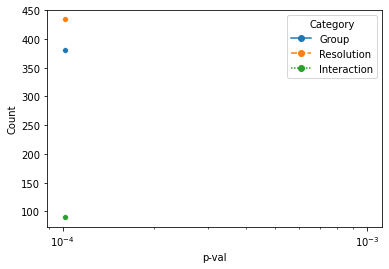

In [103]:
def significant_features(df, significant_pval, use_tqdm=True):
    
    significant_group = []
    significant_resolution = []
    significant_interaction = []
    
    if use_tqdm:
        iterator = tqdm(range(len(df_long.Feature.unique())))
    else:
        iterator = range(len(df_long.Feature.unique()))
    
    for feat_idx in iterator:
        aov = pg.anova(data=df_long.query(f'Feature == {feat_idx}'), dv='Value', between=['Label', 'Resolution'], detailed=True)

        if (aov.loc[aov['Source'] == 'Label', 'p-unc'].values < significant_pval).any():
            significant_group.append(feat_idx)
        if (aov.loc[aov['Source'] == 'Resolution', 'p-unc'].values < significant_pval).any():
            significant_resolution.append(feat_idx)
        if (aov.loc[aov['Source'] == 'Label * Resolution', 'p-unc'].values < significant_pval).any():
            significant_interaction.append(feat_idx)
    
    return significant_group, significant_resolution, significant_interaction

# pvals = [0.05, 1e-2, 1e-3, 1e-4, 1e-5]
pvals = [0.05 / 489]
sig_groups = []
sig_res = []
sig_int = []
for pval in pvals:
    out = significant_features(df_long, pval, use_tqdm=True)
    sig_groups.append(out[0])
    sig_res.append(out[1])
    sig_int.append(out[2])
    
    print(' ')
    print(f'Significance level: {pval}')
    print('===========================================================')
    print(f'Number of features with significance in group: {len(out[0])}')
    print(f'Number of features with significance in resolution: {len(out[1])}')
    print(f'Number of features with significance in interaction: {len(out[2])}')
#     print(f'Intersection of significant features: {len(set.union(*map(set, [out[0], out[1], out[2]])))}')
    print(f'Intersection of significant features: {len(set.union(*map(set, [out[0], out[2]])))}')
    print(' ')
    
ax = sns.lineplot(data=pd.DataFrame({'Count': [len(g) for g in sig_groups] + [len(g) for g in sig_res] + [len(g) for g in sig_int],
                                'Category': ['Group' for g in sig_groups] + ['Resolution' for g in sig_res] + ['Interaction' for g in sig_int],
                                'p-val': pvals + pvals + pvals}),
                  x='p-val', y='Count', hue='Category', style='Category',
                  markers=['o', 'o', 'o'],
                 )
ax.set(xscale='log')

## Filter features based on resolution, group and interaction effect size

In [8]:
def filter_significant_features(df, significant_pval, use_tqdm=True, effect='cohen'):

    import warnings
    
    significant_group = []
    significant_interaction = []
    featureidx_resolution = []
    
    if use_tqdm:
        iterator = tqdm(range(len(df_long.Feature.unique())))
    else:
        iterator = range(len(df_long.Feature.unique()))
    
    for feat_idx in iterator:
        aov = pg.anova(data=df.query(f'Feature == {feat_idx}'), dv='Value', between=['Label', 'Resolution'], detailed=True)
#         display(aov)
        sig_group, sig_int = False, False
        if (aov.loc[aov['Source'] == 'Label', 'p-unc'].values < significant_pval).any():
            significant_group.append(feat_idx)
            sig_group = True
#         if (aov.loc[aov['Source'] == 'Resolution', 'p-unc'].values < significant_pval).any():
#             significant_resolution.append(feat_idx)
        if (aov.loc[aov['Source'] == 'Label * Resolution', 'p-unc'].values < significant_pval).any():
            significant_interaction.append(feat_idx)
            sig_int = True
        if any([sig_group, sig_int]):
            
            # Do posthoc analysis and look for largest effect size in interaction. 
            # Return the resolution with largest effect size
            with warnings.catch_warnings():
                warnings.simplefilter('ignore')
                posthocs = pg.pairwise_ttests(dv='Value', between=['Resolution', 'Label'], subject='ID', data=df.query(f'Feature == {feat_idx}'), interaction=True, padjust='bonf', effsize=effect)
#                 display(posthocs)
            if effect == 'cohen':
#                 best_resolution_pval = posthocs.iloc[posthocs.loc[posthocs['Contrast'] == 'Resolution * Label', 'cohen'].apply(lambda x: np.abs(x)).idxmax()]['p-corr']
#                 print(best_resolution_pval)
#                 if best_resolution_pval < significant_pval:
                pval = posthocs.iloc[posthocs.loc[posthocs['Contrast'] == 'Resolution * Label', 'cohen'].apply(lambda x: np.abs(x)).idxmax()]['p-corr']
                best_resolution = posthocs.iloc[posthocs.loc[posthocs['Contrast'] == 'Resolution * Label', 'cohen'].apply(lambda x: np.abs(x)).idxmax()]['Resolution']
                effect_size = posthocs.iloc[posthocs.loc[posthocs['Contrast'] == 'Resolution * Label', 'cohen'].apply(lambda x: np.abs(x)).idxmax()][effect]
                featureidx_resolution.append((feat_idx, best_resolution, effect_size, pval))
#                 else:
#                     if significant_group[-1]:
#                         significant_group.pop()
#                     if significant_interaction[-1]:
#                         significant_interaction.pop()
            else:
                raise NotImplementedError
    
    
    return (
        significant_group, 
#         significant_resolution, 
        significant_interaction,
        featureidx_resolution
    )

pvals = [0.05 / 489]
sig_groups = []
sig_int = []
for pval in pvals:
    out = filter_significant_features(df_long, pval, use_tqdm=True)
    sig_groups.append(out[0])
    sig_int.append(out[1])
    
    print(' ')
    print(f'Significance level: {pval}')
    print('===========================================================')
    print(f'Number of features with significance in group: {len(out[0])}')
#     print(f'Number of features with significance in resolution: {len(out[1])}')
    print(f'Number of features with significance in interaction: {len(out[1])}')
    print(f'Intersection of significant features: {len(set.union(*map(set, [out[0], out[1]])))}')
    print(' ')
filtered_features = pd.DataFrame(out[2], columns=['Feature', 'Resolution', 'EffectSize', 'p-val'])
# filtered_features.to_csv('./filtered_features_long.csv')
display(filtered_features)
# ax = sns.lineplot(data=pd.DataFrame({'Count': [len(g) for g in sig_groups] + [len(g) for g in sig_res] + [len(g) for g in sig_int],
#                                 'Category': ['Group' for g in sig_groups] + ['Resolution' for g in sig_res] + ['Interaction' for g in sig_int],
#                                 'p-val': pvals + pvals + pvals}),
#                   x='p-val', y='Count', hue='Category', style='Category',
#                   markers=['o', 'o', 'o'],
#                  )
# ax.set(xscale='log')

/home/groups/mignot/miniconda3/envs/nml/lib/python3.6/site-packages/outdated/utils.py:18: OutdatedPackageWarning: The package outdated is out of date. Your version is 0.2.0, the latest is 0.2.1.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  **kwargs
100%|██████████| 489/489 [07:03<00:00,  1.15it/s]

 
Significance level: 0.00010224948875255624
Number of features with significance in group: 385
Number of features with significance in interaction: 314
Intersection of significant features: 416
 


,Feature,Resolution,EffectSize,p-val
0,0,900,0.639099,6.139303e-05
1,1,1,0.755755,5.162681e-07
2,2,60,-0.793987,7.415627e-08
3,3,10,-1.208250,2.453023e-19
4,4,1800,-0.671426,4.016746e-05
...,...,...,...,...
411,484,15,-0.783121,1.380185e-12
412,485,1,0.805577,1.587767e-11
413,486,1,0.748092,1.644208e-09
414,487,1,-0.810828,1.916951e-15


### Distribution of features across resolution

In [45]:
filtered_features.head()

,Feature,Resolution,EffectSize,p-val
0,0,900,0.639099,6.139303e-05
1,1,1,0.755755,5.162681e-07
2,2,60,-0.793987,7.415627e-08
3,3,10,-1.208250,2.453023e-19
4,4,1800,-0.671426,4.016746e-05


In [47]:
filtered_features.groupby('Resolution').count()

,Feature,EffectSize,p-val
Resolution,,,
1,33,33,33
3,23,23,23
5,32,32,32
10,20,20,20
15,42,42,42
30,11,11,11
60,21,21,21
150,42,42,42
300,20,20,20


In [66]:
filtered_features.groupby('Resolution').count()['Feature']

Resolution
1       33
3       23
5       32
10      20
15      42
30      11
60      21
150     42
300     20
600     14
900     25
1800    12
2700    25
3600    47
5400    30
7200    19
Name: Feature, dtype: int64

In [68]:
df1 = filtered_features.groupby('Resolution').count()
# df1 = df1.mul(100)
df1 = df1.rename('Percent').reset_index()

g = sns.catplot(x='Resolution', y='Percent', kind='bar', data=df1)
# g.ax.set_ylim(0, 100)

for p in g.ax.patches:
    txt = str(p.get_height().round(1)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

TypeError: Index(...) must be called with a collection of some kind, 'Percent' was passed

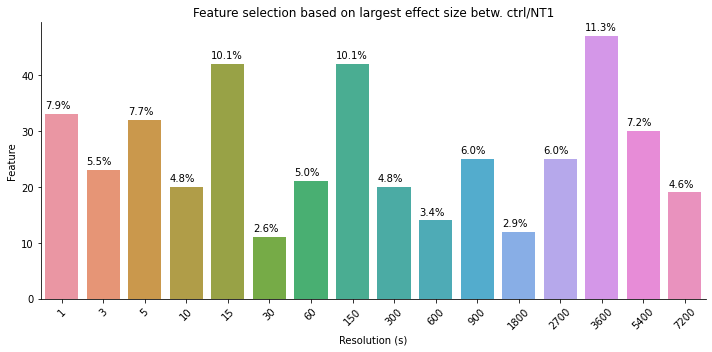

In [80]:
g = sns.catplot(kind='bar', x='Resolution', y='Feature', data=filtered_features.groupby('Resolution').count().reset_index(), aspect=2)#order=filtered_features.Resolution.unique())
plt.xticks(rotation=45)
for p in g.ax.patches:
    txt = str((p.get_height() / 416 * 100).round(1)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height() + 1
    g.ax.text(txt_x,txt_y,txt)
plt.xlabel('Resolution (s)')
plt.title('Feature selection based on largest effect size betw. ctrl/NT1')
plt.tight_layout()
g.fig.savefig('outputs/feature_distribution_across_resolutions_long.pdf', dpi=300, bbox_inches='tight')

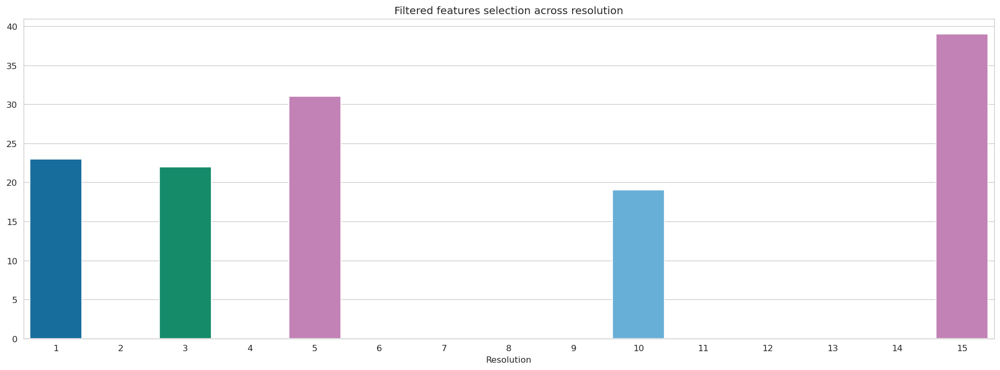

In [39]:
with sns.axes_style('whitegrid'):
    plt.figure(figsize=(16, 6), dpi=120)
    sns.countplot(
        data=pd.DataFrame(
            [(r, int(feat_descr[k][-1][0])) for r in sorted(filtered_features.Resolution.unique()) for k in filtered_features.query(f'Resolution == {r}')['Feature'].values if k < 465], columns=['Resolution', 'Feature']
        ),
        x='Resolution',
        order=range(1, 16),
        hue_order=sorted(filtered_features.Resolution.unique()),
        palette='colorblind',
    )
#     plt.yticks(range(20))
    plt.ylabel('')
    plt.title(f'Filtered features selection across resolution')
    plt.tight_layout()
#     plt.savefig('outputs/featuretypes_across_resolution.pdf', dpi=300, bbox_inches='tight')

In [9]:
from feature_descriptions import get_feature_descriptions
feat_descr = get_feature_descriptions(list(range(489)))
# len(feat_descr[0][-1][1])
feat_descr[-50:]

[(439, 439, ('5', ('N1', 'N2', 'N3', 'R'))),
 (440, 440, ('6', ('N1', 'N2', 'N3', 'R'))),
 (441, 441, ('7', ('N1', 'N2', 'N3', 'R'))),
 (442, 442, ('8', ('N1', 'N2', 'N3', 'R'))),
 (443, 443, ('9', ('N1', 'N2', 'N3', 'R'))),
 (444, 444, ('10', ('N1', 'N2', 'N3', 'R'))),
 (445, 445, ('11', ('N1', 'N2', 'N3', 'R'))),
 (446, 446, ('12', ('N1', 'N2', 'N3', 'R'))),
 (447, 447, ('13', ('N1', 'N2', 'N3', 'R'))),
 (448, 448, ('14', ('N1', 'N2', 'N3', 'R'))),
 (449, 449, ('15', ('N1', 'N2', 'N3', 'R'))),
 (450, 450, ('1', ('W', 'N1', 'N2', 'N3', 'R'))),
 (451, 451, ('2', ('W', 'N1', 'N2', 'N3', 'R'))),
 (452, 452, ('3', ('W', 'N1', 'N2', 'N3', 'R'))),
 (453, 453, ('4', ('W', 'N1', 'N2', 'N3', 'R'))),
 (454, 454, ('5', ('W', 'N1', 'N2', 'N3', 'R'))),
 (455, 455, ('6', ('W', 'N1', 'N2', 'N3', 'R'))),
 (456, 456, ('7', ('W', 'N1', 'N2', 'N3', 'R'))),
 (457, 457, ('8', ('W', 'N1', 'N2', 'N3', 'R'))),
 (458, 458, ('9', ('W', 'N1', 'N2', 'N3', 'R'))),
 (459, 459, ('10', ('W', 'N1', 'N2', 'N3', 'R')))

In [34]:
filtered_features.query('Feature >= 450 and Feature < 465')

,Feature,Resolution,EffectSize
406,450,5,-0.943349
407,451,30,-0.636045
408,452,1,-0.929840
409,453,30,0.583285
410,457,1,-0.186561
411,458,1,-0.933430
412,459,3,-0.949178
413,460,5,-0.952778
414,461,3,-0.557281
415,462,15,-0.656733


In [42]:
df_.loc[df_['Feature index'] == 8]

,Resolution,Feature index,Combination
3,1,8,1
8,1,8,1
10,1,8,1
27,1,8,2
33,1,8,2
35,1,8,2
38,1,8,2
41,1,8,2
46,1,8,2
50,1,8,3


<Figure size 5400x1800 with 0 Axes>

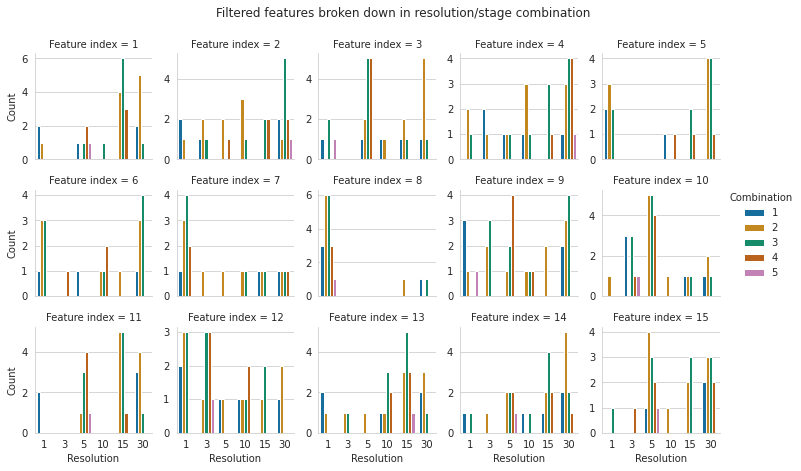

In [96]:
df_ = pd.DataFrame(
            [(r, int(feat_descr[k][-1][0]), len(feat_descr[k][-1][1])) for r in [1, 3, 5, 10, 15, 30] for k in filtered_features.query(f'Resolution == {r}')['Feature'].values if k < 465], columns=['Resolution', 'Feature index', 'Combination']
        )

with sns.axes_style('whitegrid'):
    plt.figure(figsize=(18, 6), dpi=300)
    grid = sns.catplot(x='Resolution', data=df_, kind='count',
#                        linestyles=['-', '--'], markers=['o', 's'], 
                       palette='colorblind', 
#                        ci=68, dodge=True,
                       hue='Combination', col='Feature index', col_wrap=5, height=2.0,
                       sharey=False, legend=True)
    for idx, ax in enumerate(grid.axes.flat):
        if idx % 5 == 0:
            ax.set_ylabel('Count')
    grid.fig.suptitle(f'Filtered features broken down in resolution/stage combination', y=1.05)
#     grid.fig.tight_layout()
    grid.fig.savefig('outputs/filtered_features_resolution_stagecombination.pdf', dpi=300, bbox_inches='tight')
# with sns.axes_style('whitegrid'):
#     plt.figure(figsize=(16, 6), dpi=120)
#     grid = sns.catplot(x='Resolution', data=df_, kind='count',
# #                        linestyles=['-', '--'], markers=['o', 's'], 
#                        palette='colorblind', 
# #                        ci=68, dodge=True,
#                        hue='Combination', col='Feature index', col_wrap=5, height=2.5, 
#                        sharey=False, legend=True)

# with sns.axes_style('whitegrid'):
#     plt.figure(figsize=(16, 6), dpi=120)
#     grid = sns.catplot(x='Feature index', data=df_, kind='count',
# #                        linestyles=['-', '--'], markers=['o', 's'], 
#                        palette='colorblind', 
# #                        ci=68, dodge=True,
#                        hue='Combination', col='Resolution', col_wrap=2, height=2.5, 
#                        sharey=False, legend=True)
    
# with sns.axes_style('whitegrid'):
#     plt.figure(figsize=(16, 6), dpi=120)
#     grid = sns.catplot(x='Feature index', data=df_, kind='count',
# #                        linestyles=['-', '--'], markers=['o', 's'], 
#                        palette='colorblind', 
# #                        ci=68, dodge=True,
#                        hue='Resolution', col='Combination', col_wrap=2, height=2.5, 
#                        sharey=False, legend=True)

In [26]:
print(sorted(filtered_features.Resolution.unique()))
print(len(sorted(filtered_features.Resolution.unique())))

[1, 3, 5, 10, 15, 30, 60, 150, 300, 600, 900, 1800, 2700, 3600, 5400, 7200]
16


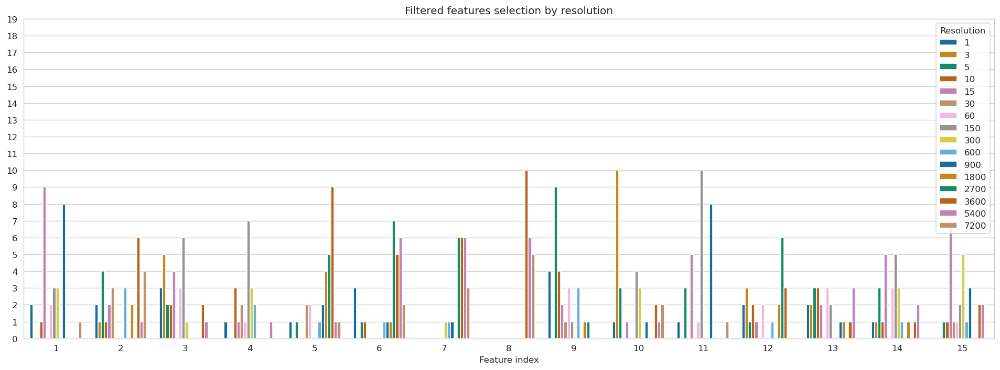

In [15]:
with sns.axes_style('whitegrid'):
    plt.figure(figsize=(16, 6), dpi=120)
    sns.countplot(
        data=pd.DataFrame(
            [(r, int(feat_descr[k][-1][0])) for r in sorted(filtered_features.Resolution.unique()) for k in filtered_features.query(f'Resolution == {r}')['Feature'].values if k < 465], columns=['Resolution', 'Feature index']
        ),
        x='Feature index',
        hue='Resolution',
        order=range(1, 16),
        hue_order=sorted(filtered_features.Resolution.unique()),
        palette='colorblind',
    )
    plt.yticks(range(20))
    plt.ylabel('')
    plt.title(f'Filtered features selection by resolution')
    plt.tight_layout()
#     plt.savefig('outputs/featuretypes_across_resolution.pdf', dpi=300, bbox_inches='tight')

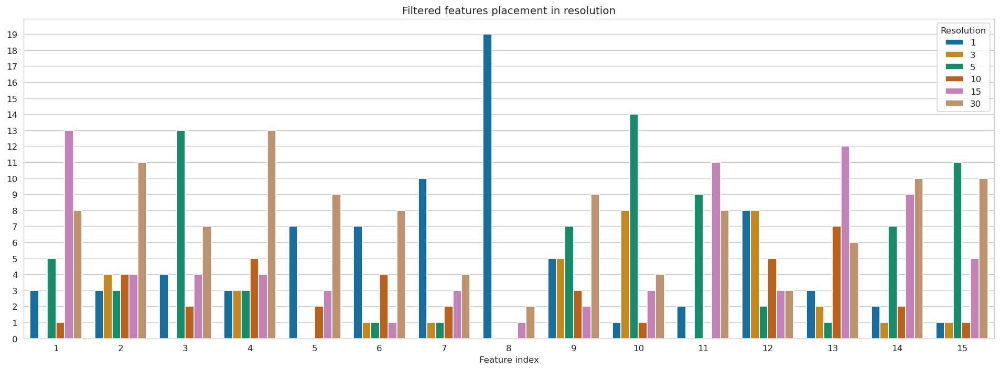

In [52]:
with sns.axes_style('whitegrid'):
    plt.figure(figsize=(16, 6), dpi=120)
    sns.countplot(
        data=pd.DataFrame(
            [(r, int(feat_descr[k][-1][0])) for r in [1, 3, 5, 10, 15, 30] for k in filtered_features.query(f'Resolution == {r}')['Feature'].values if k < 465], columns=['Resolution', 'Feature index']
        ),
        x='Feature index',
        hue='Resolution',
        order=range(1, 16),
        hue_order=[1, 3, 5, 10, 15, 30],
        palette='colorblind',
    )
    plt.yticks(range(20))
    plt.ylabel('')
    plt.title(f'Filtered features placement in resolution')
    plt.tight_layout()
#     plt.savefig('outputs/featuretypes_across_resolution.pdf', dpi=300, bbox_inches='tight')

### Distribution of effect sizes

In [27]:
df_eff = pd.DataFrame(
    [(r, k, int(feat_descr[k][-1][0]), len(feat_descr[k][-1][1]), eff, pval) 
     for r in sorted(filtered_features.Resolution.unique()) 
     for (k, eff, pval) in zip(
         filtered_features.query(f'Resolution == {r}')['Feature'].values, 
         filtered_features.query(f'Resolution == {r}')['EffectSize'].values,
         filtered_features.query(f'Resolution == {r}')['p-val'].values,
     )
     if k < 465], 
    columns=['Resolution', 'Feature', 'FeatureType', 'Combination', 'Effect', 'p-value']
)
df_eff.sort_values('Feature').head()

,Resolution,Feature,FeatureType,Combination,Effect,p-value
237,900,0,1,1,0.639099,6.139303e-05
0,1,1,2,1,0.755755,5.162681e-07
143,60,2,3,1,-0.793987,7.415627e-08
76,10,3,4,1,-1.208250,2.453023e-19
262,1800,4,5,1,-0.671426,4.016746e-05


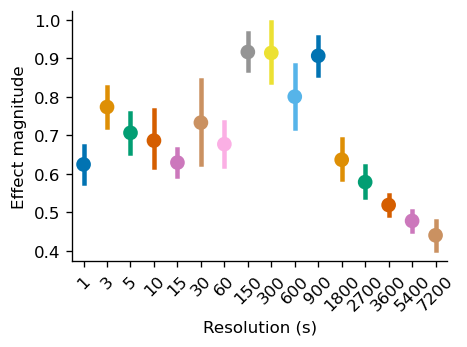

In [34]:
# with sns.axes_style('whitegrid'):
plt.figure(figsize=(4, 3), dpi=120)
sns.pointplot(data=df_eff.apply(lambda x: np.abs(x) if x.name == 'Effect' else x), x='Resolution', y='Effect', # order=[1, 3, 5, 10, 15, 30],
              palette='colorblind', 
              ci=68,
             )
plt.xlabel('Resolution (s)')
plt.ylabel('Effect magnitude')
# plt.title('Effect sizes combined across features')
sns.despine()
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('outputs/overall-effect_magnitude-across-resolution_long.pdf', dpi=300, bbox_inches='tight')

<Figure size 360x360 with 0 Axes>

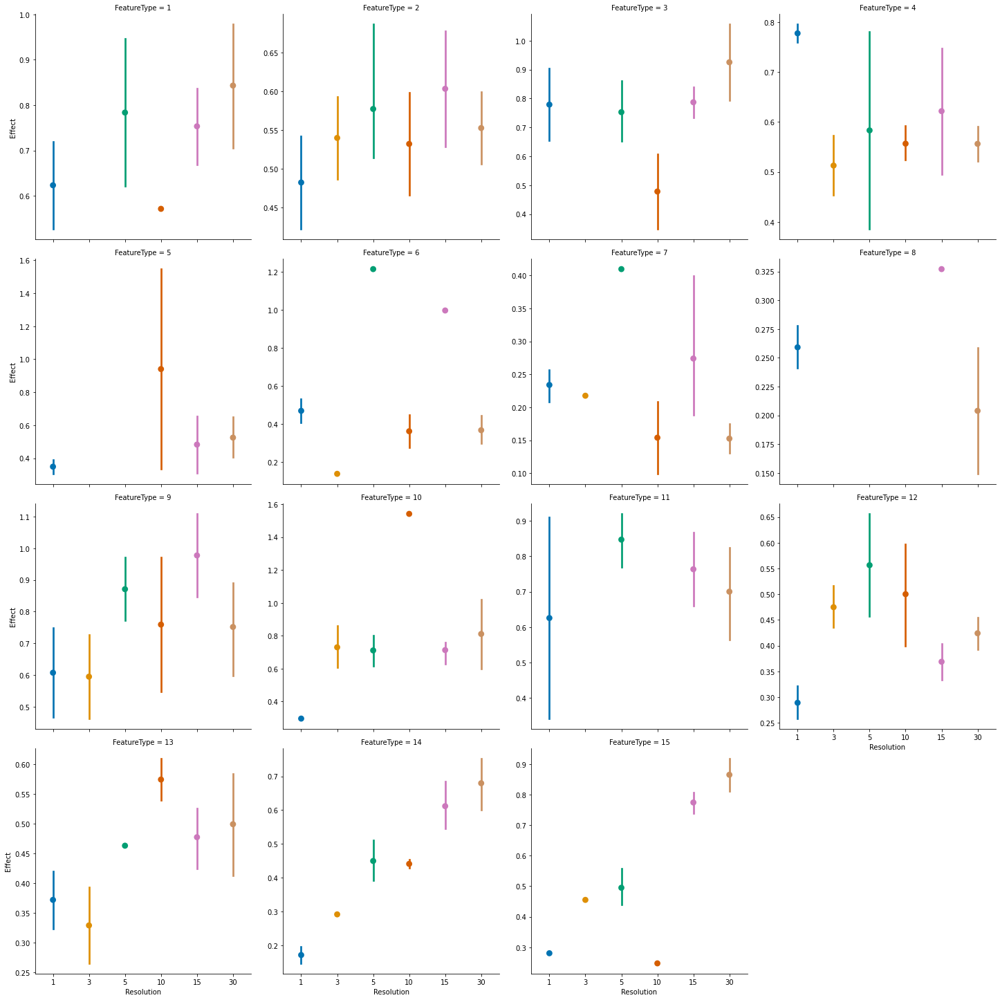

In [185]:
# with sns.axes_style('whitegrid'):
plt.figure(figsize=(3, 3), dpi=120)
sns.catplot(data=df_eff.apply(lambda x: np.abs(x) if x.name == 'Effect' else x), x='Resolution', y='Effect', order=[1, 3, 5, 10, 15, 30],
            palette='colorblind', 
            kind='point',
            ci=68,
            col='FeatureType', col_wrap=4, sharey=False
             )
# plt.xlabel('Resolution (s)')
# plt.ylabel('Effect magnitude')
# plt.title('Effect sizes combined across features')
# sns.despine()
# plt.tight_layout()
# plt.savefig('outputs/overall-effect_magnitude-across-resolution.pdf', dpi=300, bbox_inches='tight')

<Figure size 360x360 with 0 Axes>

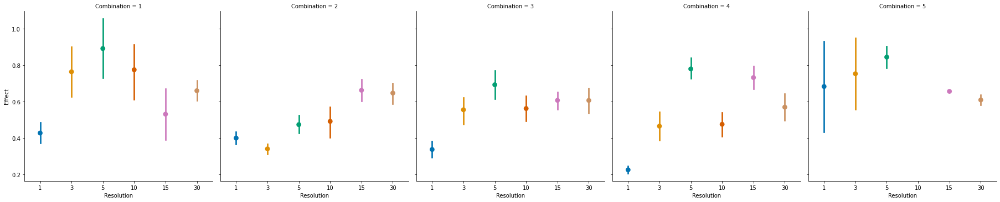

In [162]:
# with sns.axes_style('whitegrid'):
plt.figure(figsize=(3, 3), dpi=120)
sns.catplot(data=df_eff.apply(lambda x: np.abs(x) if x.name == 'Effect' else x), x='Resolution', y='Effect', order=[1, 3, 5, 10, 15, 30],
            palette='colorblind', 
            kind='point',
            ci=68,
            col='Combination',
             )
# plt.xlabel('Resolution (s)')
# plt.ylabel('Effect magnitude')
# plt.title('Effect sizes combined across features')
# sns.despine()
# plt.tight_layout()
# plt.savefig('outputs/overall-effect_magnitude-across-resolution.pdf', dpi=300, bbox_inches='tight')

In [134]:
df_eff['Feature'].unique()

array([  1,   4,   5,   7,   8,  11,  12,  17,  22,  34,  37,  45,  46,
        53,  55,  56,  57,  58,  60,  66,  68,  70,  79,  80,  94,  95,
        96,  97, 101, 102, 109, 110, 111, 112, 126, 127, 131, 144, 157,
       168, 180, 187, 188, 196, 198, 206, 217, 227, 230, 231, 232, 244,
       246, 247, 261, 266, 274, 275, 277, 281, 283, 284, 306, 307, 322,
       332, 333, 341, 365, 367, 381, 382, 411, 412, 427, 452, 457, 458,
        16,  24,  33,  54,  63,  69,  93,  98, 103, 106, 113, 116, 117,
       151, 171, 234, 248, 251, 282, 293, 296, 301, 308, 309, 311, 324,
       389, 401, 410, 416, 429, 431, 459, 461,   0,   3,  41,  62,  65,
        74,  81,  92,  99, 104, 114, 118, 119, 136, 152, 159, 164, 181,
       183, 190, 191, 192, 193, 194, 203, 204, 219, 233, 235, 239, 242,
       243, 249, 253, 254, 272, 279, 287, 294, 302, 328, 329, 330, 338,
       339, 340, 347, 354, 355, 375, 376, 377, 383, 384, 385, 388, 390,
       392, 398, 399, 400, 407, 413, 414, 422, 428, 430, 433, 43

In [142]:
df_eff.apply(lambda x: np.abs(x) if x.name == 'Effect' else x)

,Resolution,Feature,FeatureType,Combination,Effect,p-value
0,1,1,2,1,0.574814,1.214831e-04
1,1,4,5,1,0.450262,1.154233e-03
2,1,5,6,1,0.687698,9.353470e-09
3,1,7,8,1,0.428324,8.788997e-08
4,1,8,9,1,0.232410,2.503588e-01
...,...,...,...,...,...,...
413,30,423,4,4,0.576804,1.399265e-06
414,30,439,5,4,0.240837,6.638407e-02
415,30,441,7,4,0.119443,1.000000e+00
416,30,451,2,5,0.636045,1.385156e-08


## Correlation plot

In [54]:
corr

,0,1,2,3,4,5,6,7,8,9,...,479,480,481,482,483,484,485,486,487,488
0,1.000000,0.192277,0.679777,-0.438925,0.475138,0.409765,0.260316,0.158071,0.979863,0.786838,...,-0.075255,-0.132714,-0.010192,-0.148891,0.079594,0.236822,-0.163048,-0.173674,-0.264969,-0.099985
1,0.192277,1.000000,0.078547,-0.135819,0.436021,0.398342,0.429788,0.473327,0.150309,0.092594,...,0.002971,-0.108758,-0.078842,0.021298,0.010377,-0.088705,-0.021848,-0.021510,-0.158686,-0.125809
2,0.679777,0.078547,1.000000,0.121016,0.371608,0.357207,0.247183,0.177286,0.658927,0.778020,...,-0.209051,-0.096205,0.189669,-0.225386,0.089928,0.424391,-0.202210,-0.244172,-0.047296,0.052359
3,-0.438925,-0.135819,0.121016,1.000000,-0.170579,-0.122678,-0.058920,-0.005538,-0.406103,-0.133238,...,-0.057317,0.118945,0.135875,0.024929,0.042025,0.047520,-0.001930,0.032107,0.248643,0.137751
4,0.475138,0.436021,0.371608,-0.170579,1.000000,0.914721,0.797707,0.784556,0.473382,0.515921,...,-0.076628,0.044529,0.029949,-0.019134,0.165738,0.121102,-0.138805,-0.028283,0.012824,0.014233
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
484,0.236822,-0.088705,0.424391,0.047520,0.121102,0.152490,0.102032,0.049116,0.216901,0.278961,...,-0.293626,-0.010479,0.553246,-0.359646,0.056608,1.000000,0.037474,-0.112304,0.243441,0.571219
485,-0.163048,-0.021848,-0.202210,-0.001930,-0.138805,-0.144197,-0.057951,-0.061868,-0.185944,-0.239195,...,0.507529,-0.077807,-0.035849,0.332694,-0.224490,0.037474,1.000000,0.436605,0.155817,0.634924
486,-0.173674,-0.021510,-0.244172,0.032107,-0.028283,-0.066747,-0.038740,-0.019845,-0.171989,-0.163647,...,0.522865,0.418739,0.003518,0.239387,0.081456,-0.112304,0.436605,1.000000,0.253449,0.518433
487,-0.264969,-0.158686,-0.047296,0.248643,0.012824,0.032319,0.059854,0.067278,-0.248638,-0.066849,...,0.001138,0.380353,0.399809,0.282348,0.156464,0.243441,0.155817,0.253449,1.000000,0.664172


In [60]:
df.iloc[:, 3:-1].head()
corr = df.iloc[:, 3:-1].corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(40, 40), dpi=300)
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True, cbar_kws={"shrink": 0.5})

<AxesSubplot:>

## MANOVA

In [97]:
from statsmodels.multivariate.manova import MANOVA

In [99]:
df_long.head()

,ID,Cohort,Label,Resolution,Feature,Value
0,04680917_p364,KHC,0,1,0,-2.343929
1,05359781_p258,KHC,0,1,0,-2.610823
2,05486122_p453,KHC,0,1,0,-2.514548
3,07189658_p136,KHC,0,1,0,-2.058053
4,07374561_p74,KHC,1,1,0,-2.008266


In [102]:
maov = MANOVA.from_formula('Label + Resolution + Feature - 1 ~ Value', data=df_long)
print(maov.mv_test())

                      Multivariate linear model
                                                                      
----------------------------------------------------------------------
       Intercept        Value  Num DF    Den DF      F Value    Pr > F
----------------------------------------------------------------------
          Wilks' lambda 0.2059 3.0000 1660640.0000 2134344.7931 0.0000
         Pillai's trace 0.7941 3.0000 1660640.0000 2134344.7931 0.0000
 Hotelling-Lawley trace 3.8558 3.0000 1660640.0000 2134344.7931 0.0000
    Roy's greatest root 3.8558 3.0000 1660640.0000 2134344.7931 0.0000
----------------------------------------------------------------------
                                                                      
----------------------------------------------------------------------
           Value          Value  Num DF    Den DF     F Value   Pr > F
----------------------------------------------------------------------
            Wilks' lambda 0.9

In [186]:
df_long.head()

,ID,Cohort,Label,Resolution,Feature,Value
0,04680917_p364,KHC,0,1,0,-2.343929
1,05359781_p258,KHC,0,1,0,-2.610823
2,05486122_p453,KHC,0,1,0,-2.514548
3,07189658_p136,KHC,0,1,0,-2.058053
4,07374561_p74,KHC,1,1,0,-2.008266


# PCA

In [6]:
df_wide = (df_long.pivot_table(index=["ID", "Cohort", "Label"], columns=["Resolution", "Feature"], values="Value")
             .reset_index()
             .sort_values(["Cohort", "ID"])
     )
display(df_wide.head())

Resolution     ID Cohort Label         1                                 \
Feature                                0          1         2         3   
375         N0020    DHC     0 -0.748477  23.025851  0.109968  3.983868   
376         N0022    DHC     0 -1.740430  15.941547  0.075876  3.869205   
377         N0029    DHC     0 -0.621671  23.025851  0.142295  3.974492   
378         N0033    DHC     0 -0.795776  14.843493  0.116718  3.979747   
379         N0038    DHC     0 -0.878693  23.025851  0.165513  3.949262   

Resolution                                  ... 7200                           \
Feature            4          5          6  ...  479  480  481  482  483  484   
375         8.453614   9.062536  10.126471  ...  0.0  0.0  0.0  0.0  0.0  0.0   
376         6.579251   7.269617   8.509161  ...  0.0  0.0  0.0  0.0  0.0  0.0   
377         8.891787   9.561420  10.598084  ...  0.0  0.0  0.0  0.0  0.0  0.0   
378         9.818583  10.508896  11.638694  ...  0.0  0.0  0.0  0.0  0.0  0.0   
379         8.718991   9.336973  10.530442  ...  0.0  0.0  0.0  0.0  0.0  0.0   

Resolution                      
Feature     485  486  487  488  
375         0.0  0.0  0.0  0.0  
376         0.0  0.0  0.0  0.0  
377         0.0  0.0  0.0  0.0  
378         0.0  0.0  0.0  0.0  
379         0.0  0.0  0.0  0.0  

[5 rows x 7827 columns]

## Vanilla PCA

In [117]:
from sklearn.decomposition import PCA
pca = PCA(n_components=177, whiten=True)
X = df_wide[df_wide.columns[df_wide.columns.isin(range(465))]].values
X_scaled = StandardScaler().fit_transform(X)
X_pca = pca.fit_transform(X_scaled)
print(pca.explained_variance_ratio_ * 100)
print(np.cumsum(pca.explained_variance_ratio_))
n_components_90 = np.argwhere(np.cumsum(pca.explained_variance_ratio_) >= 0.90)[0][0]
n_components_optim = np.argwhere(np.cumsum(pca.explained_variance_ratio_) >= 0.99)[0][0]
print(f'Number of components explaining 90% variance: {n_components_90 + 1}')
print(f'Number of components explaining 99% variance: {n_components_optim + 1}')
print(f'Explained variance: {np.cumsum(pca.explained_variance_ratio_)[n_components_optim] * 100}')

,Feature,Resolution,EffectSize,p-val
0,0,900,0.639099,6.139303e-05
1,1,1,0.755755,5.162681e-07
2,2,60,-0.793987,7.415627e-08
3,3,10,-1.208250,2.453023e-19
4,4,1800,-0.671426,4.016746e-05


Feature,ID,Cohort,Label,0,1,2,3,4,5,6,...,478,479,480,481,482,484,485,486,487,488
375,N0020,DHC,0,-0.565096,23.025851,0.044747,3.762767,0.693147,1.386294,1.791759,...,0.0,0.000000,8.838024,8.048807,9.023969,1.791759,1.791759,1.945910,2.890372,0.000000
376,N0022,DHC,0,-1.685110,15.941547,0.047466,3.842136,-23.025851,-23.025851,-23.025851,...,0.0,7.336876,7.366955,0.000000,9.012223,1.098612,3.663562,3.332205,2.302585,0.000000
377,N0029,DHC,0,-0.450199,23.025851,0.077552,3.820478,0.693147,1.791759,2.079442,...,0.0,7.807301,8.380380,9.661903,9.426637,1.386294,2.564949,2.484907,3.332205,1.791759
378,N0033,DHC,0,-0.726126,14.843493,0.091912,3.824807,2.302585,2.890372,3.401197,...,0.0,0.000000,8.450569,9.153088,8.863378,1.791759,1.609438,2.484907,3.931826,1.098612
379,N0038,DHC,0,-0.562103,23.025851,0.116974,3.859444,0.693147,1.386294,2.079442,...,0.0,8.589737,0.000000,0.000000,10.141636,2.079442,3.091042,2.833213,3.258097,1.098612


[3.10741698e+01 1.70609691e+01 7.80194000e+00 3.62666665e+00
 3.29305652e+00 2.86698266e+00 2.11225101e+00 1.67737482e+00
 1.56765797e+00 1.27423967e+00 1.14429302e+00 1.11295102e+00
 9.25228278e-01 8.43818268e-01 7.80023123e-01 6.95958282e-01
 6.70940113e-01 5.82861968e-01 5.41028528e-01 5.39001661e-01
 5.16137636e-01 4.89023691e-01 4.78515521e-01 4.56349667e-01
 4.25342377e-01 4.18629694e-01 3.85740021e-01 3.82461380e-01
 3.54590354e-01 3.45774885e-01 3.44221487e-01 3.23628657e-01
 3.17625213e-01 3.01180516e-01 2.94029076e-01 2.81666981e-01
 2.74158138e-01 2.66795797e-01 2.61791655e-01 2.58026064e-01
 2.43666909e-01 2.33637402e-01 2.32203683e-01 2.26724738e-01
 2.21371490e-01 2.19344392e-01 2.16786685e-01 2.08288268e-01
 2.05337777e-01 1.97875112e-01 1.91926506e-01 1.88802859e-01
 1.85571704e-01 1.79943521e-01 1.76934626e-01 1.71458934e-01
 1.69217694e-01 1.64463953e-01 1.61975979e-01 1.61399923e-01
 1.60253543e-01 1.54860929e-01 1.54069715e-01 1.49283173e-01
 1.45770996e-01 1.441092

In [116]:
X_pca.std(axis=0)

array([0.99916493, 0.99916493, 0.99916493, 0.99916493, 0.99916493,
       0.99916493, 0.99916493, 0.99916493, 0.99916493, 0.99916493,
       0.99916493, 0.99916493, 0.99916493, 0.99916493, 0.99916493,
       0.99916493, 0.99916493, 0.99916493, 0.99916493, 0.99916493,
       0.99916493, 0.99916493, 0.99916493, 0.99916493, 0.99916493,
       0.99916493, 0.99916493, 0.99916493, 0.99916493, 0.99916493,
       0.99916493, 0.99916493, 0.99916493, 0.99916493, 0.99916493,
       0.99916493, 0.99916493, 0.99916493, 0.99916493, 0.99916493,
       0.99916493, 0.99916493, 0.99916493, 0.99916493, 0.99916493,
       0.99916493, 0.99916493, 0.99916493, 0.99916493, 0.99916493,
       0.99916493, 0.99916493, 0.99916493, 0.99916493, 0.99916493,
       0.99916493, 0.99916493, 0.99916493, 0.99916493, 0.99916493,
       0.99916493, 0.99916493, 0.99916493, 0.99916493, 0.99916493,
       0.99916493, 0.99916493, 0.99916493, 0.99916493, 0.99916493,
       0.99916493, 0.99916493, 0.99916493, 0.99916493, 0.99916

X_pca.shape:  (599, 177)


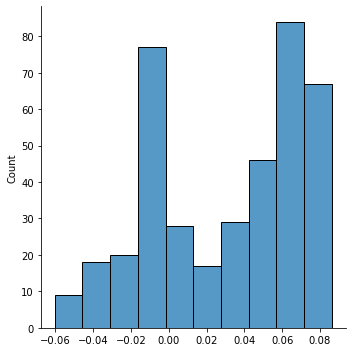

In [115]:
print('X_pca.shape: ', X_pca.shape)
sns.displot(pca.components_[0])

## Sparse PCA

In [14]:
from sklearn.preprocessing import StandardScaler, RobustScaler

df_wide = (df_long#.merge(filtered_features)
             #.drop("EffectSize", axis=1)
             .pivot_table(index=["ID", "Cohort", "Label"], columns=["Resolution", "Feature"], values="Value")
             .reset_index()
             .sort_values(["Cohort", "ID"])
     )
display(df_wide.head())
X = df_wide.iloc[:, 3:]
y = df_wide.Label.values

# Scale
x = RobustScaler(quantile_range=[15, 85]).fit_transform(X)

Resolution     ID Cohort Label         1                                 \
Feature                                0          1         2         3   
375         N0020    DHC     0 -0.748477  23.025851  0.109968  3.983868   
376         N0022    DHC     0 -1.740430  15.941547  0.075876  3.869205   
377         N0029    DHC     0 -0.621671  23.025851  0.142295  3.974492   
378         N0033    DHC     0 -0.795776  14.843493  0.116718  3.979747   
379         N0038    DHC     0 -0.878693  23.025851  0.165513  3.949262   

Resolution                                  ... 7200                           \
Feature            4          5          6  ...  479  480  481  482  483  484   
375         8.453614   9.062536  10.126471  ...  0.0  0.0  0.0  0.0  0.0  0.0   
376         6.579251   7.269617   8.509161  ...  0.0  0.0  0.0  0.0  0.0  0.0   
377         8.891787   9.561420  10.598084  ...  0.0  0.0  0.0  0.0  0.0  0.0   
378         9.818583  10.508896  11.638694  ...  0.0  0.0  0.0  0.0  0.0  0.0   
379         8.718991   9.336973  10.530442  ...  0.0  0.0  0.0  0.0  0.0  0.0   

Resolution                      
Feature     485  486  487  488  
375         0.0  0.0  0.0  0.0  
376         0.0  0.0  0.0  0.0  
377         0.0  0.0  0.0  0.0  
378         0.0  0.0  0.0  0.0  
379         0.0  0.0  0.0  0.0  

[5 rows x 7827 columns]

(599, 7824)


In [15]:
from sklearn.decomposition import SparsePCA
spca = SparsePCA(n_components=100, n_jobs=-1)
spca.fit(x)
print(spca.explained_variance_ratio_ * 100)
print(np.cumsum(spca.explained_variance_ratio_))

KeyboardInterrupt: 